<a href="https://colab.research.google.com/github/BaharehYekkehkhany/Sea-wind-speed-and-direction-estimation-using-SAR/blob/main/WDIR_regression_22_04_20.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
## install the last version of scikit-learn
!pip install -U scikit-learn
## show the version of installed scikit-learn
!python -m pip show scikit-learn
# gspread.__version__

Name: scikit-learn
Version: 1.0.2
Summary: A set of python modules for machine learning and data mining
Home-page: http://scikit-learn.org
Author: None
Author-email: None
License: new BSD
Location: /usr/local/lib/python3.7/dist-packages
Requires: threadpoolctl, numpy, joblib, scipy
Required-by: yellowbrick, sklearn, sklearn-pandas, mlxtend, lightgbm, librosa, imbalanced-learn


In [ ]:
##------------------------------------------------------------------------------
## regression, quad-pol, image size: 512 by 512
## parameter selection after the incidence angle and wind speed filters
##------------------------------------------------------------------------------

## panda: load and store dataframe structures (tabular data)
import pandas as pd
## numpy: a numerical python library; to work with multi-dimentional arrays and mtrices
import numpy as np
## matplotlib: 2D and 3D plotting
import matplotlib.pyplot as plt
## sklearn: machine learning methods
## sklearn.linear_model.LinearRegression: provides linear regression function
from sklearn.linear_model import LinearRegression, LogisticRegression
from sklearn.linear_model import Lasso, LassoCV, Ridge
from sklearn.metrics import explained_variance_score, max_error
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.preprocessing import PolynomialFeatures, normalize
## Msklearn.neural_network.MLPRegressor: multi-layer Perceptron regressor
## This model optimizes the squared-loss using LBFGS or stochastic gradient descent.
from sklearn.neural_network import MLPRegressor
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score, cross_validate
from sklearn.model_selection import RepeatedKFold
from sklearn.ensemble import RandomForestRegressor
# from sklearn import metrics
# import seaborn as sns
# # SVM classifier
# from sklearn.svm import SVC
# # to prepare data for SVM classification
# from sklearn.datasets.samples_generator import make_blobs
# from sklearn.datasets.samples_generator import make_circles
# from mpl_toolkits.mplot3d import Axes3D
## to load .mat files
from scipy.io import loadmat
from numpy import arange
import cmath
# ## to use HDF reader for matlab v7.3 files
# import h5py
import scipy
import scipy.io as spio
import math
## This snippet uses the open-source gspread library for interacting with Sheets.
import gspread

## https://www.youtube.com/watch?v=maiQf8ray_s
from scipy.stats import zscore
from sklearn import metrics
from scipy.stats import zscore
from sklearn.model_selection import KFold
from sklearn.model_selection import RepeatedKFold
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Activation

import tensorflow as tf

## to use epsilon
import sys
## to find the best hyperparameters of a model based on cross-validation method
## first, install the last version of scikit-learn
## !pip install -U scikit-learn
from sklearn.experimental import enable_halving_search_cv  # noqa
from sklearn.model_selection import HalvingRandomSearchCV
from scipy.stats import randint

##------------------------------------------------------------------------------
## change directory to google drive to read input and output data

from google.colab import drive
drive.mount('/content/drive')


##------------------------------------------------------------------------------
## import data

## This function is a modified version of scipy.io.loadmat to read nested structures saved as .mat
## MATLAB reference: https://ch.mathworks.com/matlabcentral/answers/383427-proper-importing-of-matlab-structures-into-python
## Stack Overflow reference: https://stackoverflow.com/questions/7008608/scipy-io-loadmat-nested-structures-i-e-dictionaries
def load_mat(filename):
    '''
    this function should be called instead of direct spio.loadmat
    as it cures the problem of not properly recovering python dictionaries
    from mat files. It calls the function check keys to cure all entries
    which are still mat-objects
    '''
    def _check_keys(d):
        '''
        checks if entries in dictionary are mat-objects. If yes
        todict is called to change them to nested dictionaries
        '''
        for key in d:
            if isinstance(d[key], spio.matlab.mio5_params.mat_struct):
                d[key] = _todict(d[key])
        return d

    def _todict(matobj):
        '''
        A recursive function which constructs from matobjects nested dictionaries
        '''
        d = {}
        for strg in matobj._fieldnames:
            elem = matobj.__dict__[strg]
            if isinstance(elem, spio.matlab.mio5_params.mat_struct):
                d[strg] = _todict(elem)
            elif isinstance(elem, np.ndarray):
                d[strg] = _tolist(elem)
            else:
                d[strg] = elem
        return d

    def _tolist(ndarray):
        '''
        A recursive function which constructs lists from cellarrays
        (which are loaded as numpy ndarrays), recursing into the elements
        if they contain matobjects.
        '''
        elem_list = []
        for sub_elem in ndarray:
            if isinstance(sub_elem, spio.matlab.mio5_params.mat_struct):
                elem_list.append(_todict(sub_elem))
            elif isinstance(sub_elem, np.ndarray):
                elem_list.append(_tolist(sub_elem))
            else:
                elem_list.append(sub_elem)
        return elem_list
    data = scipy.io.loadmat(filename, struct_as_record=False, squeeze_me=True)
    return _check_keys(data)


def import_data(inputs_address, outputs_address, data_all_address):

  """
## import dataset: reading RS2 and Buoy data as well as parameters extracted
## from RS2 full-polarimetric data

## inputs
## inputs: a structure that contains all parameters as predictor variables
## Here, parameters are mean parameters of the whole image chip
## inputs structure includes parameters extracted from image chip sizes of
## 512*512 while buoys are at the center of the images.

## outputs: a structure that contains wind speed and wind direction that are
## the values that are to be estimated.
## wind speed and wind direction values are based on the buoy measurements.
## Here, wind speeds are at the height of 10 meters above the sea surface.
## Buoy measurements are transferred to the height of 10 m by LKB algorithm.
## Here, wind directions are relative wind directions with regard to
## incident azimuth angle that is calculated as
## relative_wdir(i) = mod((heading(i) - wdir(i)), 360);
## heading is the incident azimuth angle and wdir is buoy measurement

## output
## inputs: a panda.DataFrame that includes all inputs
## outputs: a panda.DataFrame that includes all outputs

  """

  # inputs = load_mat(r"E:\\Codes\PolSAR_features_Python\New folder\inputs.mat")['inputs']
  # inputs = load_mat('/content/drive/My Drive/Colab Notebooks/inputs.mat')['inputs']
  inputs = load_mat(inputs_address)['inputs']
  inputs = inputs['inputs']
  inputs = pd.DataFrame.from_dict(inputs)
  ## replace +/- inf values with nan
  inputs.replace([np.inf, -np.inf], np.nan, inplace=True)
  # print(inputs.isna().sum())
  # ## replace nan values with 0
  # inputs.fillna(0, inplace=True)
  ## return inputs with absolute numeric value of each element
  # inputs['PRDF_HH_HV'] = (inputs['Dca_HH'] - inputs['Dca_HV'])
  # print((np.array(inputs['Dca_HH']) - np.array(inputs['Dca_VV'])))
  # inputs['PRDF_HH_VV'] = (np.array(inputs['Dca_HH']) - np.array(inputs['Dca_VV'])).tolist()
  # inputs['PRDF_HV_VV'] = (np.array(inputs['Dca_HV']) - np.array(inputs['Dca_VV'])).tolist()

  ## all data with all the Rs2 measurements, polSAR calculated parameters, and buoy measurements
  ## E:\Codes\read_image_generate_parameters_211208\data_all_20211209
  data_all = load_mat(data_all_address)['data_all']
  data_all = data_all['data_all']
  data_all = pd.DataFrame.from_dict(data_all)
  ## replace +/- inf values with nan
  data_all.replace([np.inf, -np.inf], np.nan, inplace=True)

  # outputs = load_mat(r"E:\\Codes\PolSAR_features_Python\New folder\outputs.mat")['outputs']
  # outputs = load_mat('/content/drive/My Drive/Colab Notebooks/outputs.mat')['outputs']
  outputs = load_mat(outputs_address)['outputs']
  outputs = outputs['outputs']
  outputs = pd.DataFrame.from_dict(outputs)
  ## replace +/- inf values with nan
  outputs.replace([np.inf, -np.inf], np.nan, inplace=True)
  # print(outputs.isna().sum())
  # ## replace nan values with 0
  # outputs.fillna(0, inplace=True)

  ## remove invalid data
  input_nan_index = inputs.index[inputs.isnull().any(1)].tolist()
  output_nan_index = outputs.index[outputs.isnull().any(1)].tolist()
  inputs.drop(input_nan_index + output_nan_index, inplace=True)
  outputs.drop(input_nan_index + output_nan_index, inplace=True)
  data_all.drop(input_nan_index + output_nan_index, inplace=True)

  return inputs, outputs, data_all

##------------------------------------------------------------------------------
## adding polSAR parameters
def parameter_adding(inputs, scaling_model):

  ## polarized residual Doppler frequency (based on Faozi Saeid's thesis 2015)
  inputs['PRDF_HH_VV'] = (np.array(inputs['Dca_HH']) - np.array(inputs['Dca_VV'])).tolist()
  inputs['PRDF_HV_VV'] = (np.array(inputs['Dca_HV']) - np.array(inputs['Dca_VV'])).tolist()

  ## parameters based on coherence matrix
  eigen_value_1 = inputs('eigen_value_1')
  eigen_value_2 = inputs('eigen_value_2')
  eigen_value_3 = inputs('eigen_value_3')
  sum_eigen_values = eigen_value_1 + eigen_value_2 + eigen_value_3
  P_1 = eigen_value_1/sum_eigen_values
  P_2 = eigen_value_2/sum_eigen_values
  P_3 = eigen_value_3/sum_eigen_values
  ## Cloude and Pottier decomposition [31, 32, 35 Paper A, AAFC]
  alpha_CloudePottier = math.pi/2*(P_2 + P_3) ## an indicator of the average or dominant scattering
  anisotropy_CloudePottier = (P_2 - P_3)/(P_2 + P_3) ## an indicator of the intensity disparity between the second and the third scattering mechanisms
  entropy_CloudePottier = -(P_1*math.log10(P_1)/math.log10(3) + P_2*math.log10(P_2)/math.log10(3) + P_3*math.log10(P_3)/math.log10(3)) ## an indicator of the degree of randomness of the scattering mechanisms
  ## pedestal height
  pedestal_height = min([eigen_value_1, eigen_value_2, eigen_value_3])/max([eigen_value_1, eigen_value_2, eigen_value_3]) ## an indicator of the portion of the unpolarized scattering component, a measure of randomness in the scattering process

  ##parameters based on scattering matrix
  ## Freeman_Durden decomposition
  # surface_FreemaDurden =
  # double_bounce_FreemaDurden =
  # volume_FreemaDurden =

  return inputs

##------------------------------------------------------------------------------
## predictor variable scaling
def predictor_scaling(inputs, scaling_model):
  if scaling_model == "standardization":
    inputs_scaled = (inputs - inputs.mean())/(inputs.std() + sys.float_info.epsilon)
  elif scaling_model == "normalization":
    inputs_scaled = (inputs - inputs.min())/(inputs.max() - inputs.min() + sys.float_info.epsilon)

  return inputs_scaled

##------------------------------------------------------------------------------
## predictor variable selection
def predictor_selection(inputs, outputs, alpha, selection_criteria, model_name):

  # https://www.geeksforgeeks.org/implementation-of-lasso-ridge-and-elastic-net/
  # Elasticnet
  if model_name.lower() in ['lasso']:
    # Lasso(alpha=1.0, *, fit_intercept=True, normalize=True,\
    #     precompute=False, copy_X=True, max_iter=1000, tol=0.0001, \
    #     warm_start=False, positive=False, random_state=None, selection='cyclic')
    model = Lasso(alpha=alpha)
    # model.fit(inputs.values.real, outputs['relative_wdir'])
    model.fit(inputs.astype(np.float64), outputs['relative_wdir'])
    # selected_columns = abs(model.coef_) > selection_criteria
    selected_columns = abs(model.coef_) > 0.0001
    if np.any(selected_columns):
      selected_inputs = inputs.loc[:, selected_columns]
    else:
      selected_columns = abs(model.coef_) == max(abs(model.coef_))
      # print(selected_columns)
      selected_inputs = inputs.loc[:, selected_columns]
    print('\nselected input features')
    print(selected_inputs.keys())
    # print('\n input coefficients after feature selection:')
    # print(model.coef_)

  elif model_name.lower() in ['ridge']:
    ## Ridge(alpha=1.0, *, fit_intercept=True, normalize=False, copy_X=True, \
    ##  max_iter=None, tol=0.001, solver='auto', random_state=None)
    model = Ridge(alpha=alpha)
    model.fit(inputs.values, outputs)
    selected_columns = abs(model.coef_) > selection_criteria
    if np.any(selected_columns):
      selected_inputs = inputs.loc[:, selected_columns]
    else:
      selected_columns = abs(model.coef_) == max(abs(model.coef_))
      # print(selected_columns)
      selected_inputs = inputs.loc[:, selected_columns]
    print('\nselected input features')
    print(selected_inputs.keys())
    # print('\n input coefficients after feature selection:')
    # print(model.coef_)

  elif model_name.lower() in ['correlation']:
    ## correlation coefficient between the relative wind direction and
    ## Radarsat-2 polarimetric features
    corre_coefs = []
    # cc = []
    corrs = []
    for field in inputs.keys():
      corre_coef = np.corrcoef(np.transpose(inputs[field]).astype(float), \
              np.transpose(outputs.values).astype(float))
      corre_coefs.append([corre_coef[0, 1]])
      corrs.append([field, corre_coef[0, 1]])
    print('correlation coefficient between the relative wind directions and '
          'Radarsat-2 polarimetric features: ')
    print(corrs)
    # print(corre_coefs)
    # print(inputs.keys())
    # cc = pd.DataFrame(np.transpose(corre_coefs), columns=inputs.keys(), index=None)
    # print('correlation coefficient between the relative wind directions and '
    #       'Radarsat-2 polarimetric features: ')
    # print(cc)
    selected_columns = cc.abs() > selection_criteria
    if np.any(selected_columns.values):
      selected_inputs = inputs.loc[:, selected_columns.values.transpose()]
    else:
      selected_columns = abs(cc.values) == max(abs(cc.values))
      selected_inputs = inputs.loc[:, selected_columns.values.transpose()]
    print('\nselected input features')
    print(selected_inputs.keys())
    print('\n selected input correlation coefficients with relative wind direction:')
    print(cc.loc[:, selected_columns.values.transpose()])

  ## plot selected features vs Buoy WDIR
  for key in selected_inputs.keys():
    plt.scatter(outputs.values, selected_inputs[key])
    plt.xlabel("Buoy WDIR")
    plt.ylabel(key)
    plt.show()
  return selected_inputs


##------------------------------------------------------------------------------
## regression models
##------------------------------------------------------------------------------
## MLP regression
def mlp_regression(input, output, data_all, k_fold, n_repeats):

## neural network multi-layer Perceptron (NN-MLP) regressor
## This model optimizes the squared-loss using LBFGS or stochastic gradient descent.
## rvaluate the model predictions using the test data

## input:
## x_train, y_train: train data
## x_test, y_test: test data
## max_iter: maximum iteration of the MLP regressor

## output:
  # model = MLPRegressor(max_iter, batch_size=min(batch_size, x_train.shape[0]), \
  #                       random_state=1)

  # file_NN_results.writerow(['Neural Network'])
  # file_NN_results.writerow(['maximum number of iterations'] + [max_iter])
  print('\n ***** neural network *****')

  data = data_all.copy()

  x = input.values.astype(float)
  y = output.values.astype(float)
  data_all = data_all.values

  ## sample size
  n_of_samples = np.shape(input)[0]
  ## check that sample size is larger than the split size
  if (n_of_samples > k_fold):

    ## cross validation iterators
    # ## K-fold
    # # from sklearn.model_selection import KFold
    # shuffle = True
    # random_state = 42
    # kf = KFold(n_splits=k_fold, shuffle=shuffle, random_state=random_state)
    # cvi = kf
    # file_NN_results.writerow(['k-fold is used.'])
    # file_NN_results.writerow(['k_fold'] + [k_fold])
    # file_NN_results.writerow(['shuffle'] + [shuffle])
    # file_NN_results.writerow(['random state'] + [random_state])
    ## repeated K-fold
    from sklearn.model_selection import RepeatedKFold
    # n_repeats = 3
    random_state = 42
    rkf = RepeatedKFold(n_splits=k_fold, n_repeats=n_repeats, \
                        random_state=random_state)
    cvi = rkf
    # file_NN_results.writerow(['repeated k-fold is used.'])
    # file_NN_results.writerow(['k_fold'] + [k_fold])
    # file_NN_results.writerow(['number of repeats'] + [n_repeats])
    # file_NN_results.writerow(['random state'] + [random_state])
    ## leave one out
    # from sklearn.model_selection import LeaveOneOut
    # loo = LeaveOneOut()
    # cvi = loo
    # file_NN_results.writerow(['leave-one-out is used.'])
    ## leave P out
    # from sklearn.model_selection import LeavePOut
    # p = 2
    # lpo = LeavePOut(p=p)
    # cvi = lpo
    # file_NN_results.writerow(['leave-p-out is used.'])
    # file_NN_results.writerow(['p'] + [p])
    ## Random permutations cross-validation a.k.a. Shuffle & Split
    # from sklearn.model_selection import ShuffleSplit
    # test_size = 0.2
    # random_state = 1
    # ss = ShuffleSplit(n_splits=k_fold, test_size=test_size, \
    #                   random_state=random_state)
    # cvi = ss
    # file_NN_results.writerow(['Random permutations cross-validation a.k.a. Shuffle & Split is used.'])
    # file_NN_results.writerow(['k_fold'] + [k_fold])
    # file_NN_results.writerow(['test size'] + [test_size])
    # file_NN_results.writerow(['random state'] + [random_state])

    oos_y = []
    oos_pred = []

    rmse_all = []
    r2_all = []
    cc_all = []
    mae_all = []

    # model_evaluation = 360 # for rmse and mae
    model_evaluation = 0 # for r2 and cc
    fold = 0
    for train, test in cvi.split(x):
      fold+=1
      print(f"Fold #{fold}")
      # file_NN_results.writerow(['fold number'] + [fold])

      x_train = x[train]
      y_train = y[train]
      data_all_train = data_all[train]
      x_test = x[test]
      y_test = y[test]
      data_all_test = data_all[test]

      ## Function to create model, required for KerasRegressor
      def create_model(neurons_1 = 60, neurons_2 = 30, input_dim = x.shape[1], \
                       activation_1 = 'relu', activation_2 = 'relu', \
                       optimizer = 'Adam'):
      # def create_model(neurons_1 = 60, neurons_2 = 30, input_dim = x.shape[1], \
      #                  activation = 'relu', optimizer = 'Adam'):
        ## create model
        mlp = Sequential()
        mlp.add(Dense(neurons_1, activation_1, input_dim=input_dim))
        mlp.add(Dense(neurons_2, activation_2))
        # mlp.add(Dense(neurons_1, input_dim=input_dim, activation=activation))
        # mlp.add(Dense(neurons_2, activation=activation))
        mlp.add(Dense(1))
        mlp.compile(loss='mae', optimizer=optimizer, \
                      metrics=[tf.keras.metrics.RootMeanSquaredError()]) # loss='mean_squared_error'
        return mlp

      ## Use Keras Deep Learning Models with Scikit-Learn in Python
      ## https://machinelearningmastery.com/use-keras-deep-learning-models-scikit-learn-python/
      ## https://machinelearningmastery.com/grid-search-hyperparameters-deep-learning-models-python-keras/
      from keras.wrappers.scikit_learn import KerasRegressor
      ## create model
      epochs = 500
      mlp = KerasRegressor(build_fn=create_model, verbose=0, epochs=epochs)
      ## define the random search parameters
      # param_distributions = {"neurons_1": randint(5, 80),
      #                        "neurons_2": randint(2, 50),
      #                        "activation": ['softmax', 'softplus', \
      #                                         'softsign', 'relu', 'tanh', \
      #                                         'sigmoid', 'hard_sigmoid', \
      #                                         'linear'],
      #                        "optimizer": ['Adadelta', 'Adagrad', 'Adam', \
      #                                      'Adamax', 'Ftrl', 'Nadam', \
      #                                      'RMSprop', 'SGD'],
      #                        "epochs": [100, 300, 500, 700, 900]
      #                        }
      param_distributions = {"neurons_1": [60],
                            "neurons_2": [30],
                            "activation_1": ['relu'],
                            "activation_2": ['relu'],
                            "optimizer": ['Adam'],
                            "epochs": [500]
                            }
      search = HalvingRandomSearchCV(mlp, param_distributions,
               random_state=0).fit(x_train, y_train.ravel())
      model_best_parameters = search.best_params_
      # print('\nbest model parameter: ')
      # print(search.best_params_)
      # print('\n')
      model = search.best_estimator_
      history = model.fit(x_train, y_train, validation_data=(x_test, y_test), \
                          verbose=0)

      ## prediction on the test data
      pred = model.predict(x_test)

      ## out of sample: oos
      oos_y.append(y_test)
      oos_pred.append(pred)

      ## measure this fold's score for evaluation (score can be rmse, mae, r2, or cc)
      # score = np.sqrt(metrics.mean_squared_error(pred, y_test))
      score = r2_score(y_test, pred)

      ## save all rmse, r^2, cc, and mae of all folds for further statistical results
      rmse_all.append(np.sqrt(metrics.mean_squared_error(pred, y_test)))
      r2_all.append(r2_score(y_test, pred))
      cc = np.corrcoef(np.transpose(pred), np.transpose(y_test))
      cc_all.append(cc[0, 1])
      mae_all.append(mean_absolute_error(y_test, pred))

      ## find the best model and predict the output (WDIR) for all the input data
      ## with the best model
      # if score < model_evaluation: # for rmse and mae
      if score > model_evaluation: # for r2 and cc
        model_evaluation = score
        output_predict = model.predict(x)
        best_x_train = x_train
        best_y_train = y_train
        best_x_test = x_test
        best_y_test = y_test

        best_rmse = np.sqrt(metrics.mean_squared_error(pred, y_test))
        best_r2 = r2_score(y_test, pred)
        cc = np.corrcoef(np.transpose(pred), np.transpose(y_test))
        best_cc = cc[0, 1]
        best_mae = mean_absolute_error(y_test, pred)

        best_fold = fold

        best_model = model
        best_model_parameters = model_best_parameters

        best_data_all_train = data_all_train
        best_data_all_test = data_all_test

    create_colored_plots(data, best_data_all_train, best_data_all_test, \
                         best_model.predict(best_x_train), best_y_train, \
                         best_model.predict(best_x_test), best_y_test, \
                         model_name = 'NN resgression')

    ## Show the statistics for the best fold
    print(f"\n \nBest fold number: {best_fold}")
    print(f"Best model rmse: {best_rmse:5.3f}")
    print(f"Best model mae: {best_mae:5.3f}")
    print(f"Best model r2: {best_r2:5.3f}")
    print(f"Best model cc: {best_cc:5.3f}")
    print(f"Best model parameters: {best_model_parameters} \n \n")

    ## plot feature importance based on feature permutation
    ## https://scikit-learn.org/stable/auto_examples/ensemble/plot_forest_importances.html
    from sklearn.inspection import permutation_importance
    feature_names = input.keys()
    result = permutation_importance(best_model, best_x_test, best_y_test, \
        n_repeats=10, random_state=42, n_jobs=2)
    forest_importances = pd.DataFrame({'importances':result.importances_mean, \
        'std':result.importances_std}, index=feature_names)
    ## sort features based on their importance
    forest_importances.sort_values(by=['importances'], ascending=False, \
                                   inplace=True)
    fig, ax = plt.subplots()
    forest_importances[\
        'importances'][0:10].plot.bar(yerr=forest_importances['std'][0:10], ax=ax)
    ax.set_title("Feature importances using permutation on full model")
    ax.set_ylabel("Mean accuracy decrease")
    fig.tight_layout()
    plt.show()

    ## box plots of rmse, r^2, cc, and mas for all folds
    print('statistics \n')
    fig, axs = plt.subplots(2, 2)
    statistics = pd.DataFrame(rmse_all, columns=['RMSE'])
    boxplot = statistics.boxplot(ax=axs[0, 0])

    statistics = pd.DataFrame(mae_all, columns=['MAE'])
    boxplot = statistics.boxplot(ax=axs[0, 1])

    statistics = pd.DataFrame(r2_all, columns=['R^2'])
    boxplot = statistics.boxplot(ax=axs[1, 0])

    statistics = pd.DataFrame(cc_all, columns=['CC'])
    boxplot = statistics.boxplot(ax=axs[1, 1])
    plt.show()

    ## build the oos prediction list and calculate error
    oos_y = np.concatenate(oos_y)
    oos_pred = np.concatenate(oos_pred)
    score = np.sqrt(metrics.mean_squared_error(oos_pred, oos_y))
    print(f"\n \nFinal, out of sample rmse: {score}")
    print(f"Final, out of sample mean absolute error: {mean_absolute_error(oos_y, oos_pred)}")
    print(f"Final, out of sample r2: {r2_score(oos_y, oos_pred)}")
    corre_coef = np.corrcoef(np.transpose(oos_pred), \
                np.transpose(oos_y))
    print(f"Final, out of sample correlation coefficient: {corre_coef[0, 1]} \n \n")
    # print(f"Final, out of sample maximum residual error: {max_error(oos_y, oos_pred)}")

    ## write the cross validation prediction
    oos_y = pd.DataFrame(oos_y)
    oos_pred = pd.DataFrame(oos_pred)
    oosDF = pd.concat([oos_y, oos_pred], axis=1)
    # oosDF.to_csv(filename_write, index=False)

  else:
    output_predict = np.empty([0,0])
    print('\nNN: Sample size is less than number of splits!')


  # return output_predict, accuracy, std
  return output_predict

##------------------------------------------------------------------------------
## Random forest (RF) regression
def random_forest_regression(input, output, data_all, k_fold, n_repeats):

  ## input:
  ## input: all parameters extracted from pol-SAR data as predictors
  ## output: the target which is the NDVI values based on RapiEye observations
  ## k_fold: number of subsections defined in cross validation

  ## output:
  ## output_predict: predicted NDVI values

  print('\n ***** random forest *****')

  data = data_all.copy()

  x = input.values.astype(float)
  y = output.values.astype(float)
  data_all = data_all.values

  ## sample size
  n_of_samples = np.shape(input)[0]
  ## check that sample size is larger than the min_resources_=10
  ## to avoid this error: min_resources_=10 is greater than max_resources_=(# of samples)
  if (n_of_samples < 11):
    output_predict = np.empty([0,0])
    print('\nRF: Sample size is less than number of splits!')
    ## I changed k_fold here so that it does not go to the other if and avoid
    ## this error: min_resources_=10 is greater than max_resources_=(# of samples)
    k_fold = 1000

  ## check that sample size is larger than the split size
  if (n_of_samples > k_fold):
    ## cross validation iterators
    # ## K-fold
    # from sklearn.model_selection import KFold
    # kf = KFold(n_splits=k_fold, shuffle=True, random_state=42)
    # cvi = kf
    ## repeated K-fold
    from sklearn.model_selection import RepeatedKFold
    rkf = RepeatedKFold(n_splits=k_fold, n_repeats=n_repeats, random_state=42)
    cvi = rkf
    ## leave one out
    # from sklearn.model_selection import LeaveOneOut
    # loo = LeaveOneOut()
    # cvi = loo
    ## leave P out
    # from sklearn.model_selection import LeavePOut
    # lpo = LeavePOut(p=2)
    # cvi = lpo
    ## Random permutations cross-validation a.k.a. Shuffle & Split
    # from sklearn.model_selection import ShuffleSplit
    # ss = ShuffleSplit(n_splits=k_fold, test_size=0.2, random_state=1)
    # cvi = ss


    oos_y = []
    oos_pred = []

    rmse_all = []
    r2_all = []
    cc_all = []
    mae_all = []

    # model_evaluation = 360 # for rmse and mae
    model_evaluation = 0 # for r2 and cc
    fold = 0
    for train, test in cvi.split(x):
      fold+=1
      print(f"\n Fold #{fold}")

      x_train = x[train]
      y_train = y[train]
      data_all_train = data_all[train]
      x_test = x[test]
      y_test = y[test]
      data_all_test = data_all[test]

      # define the model
      # RandomForestRegressor(n_estimators=100, *, criterion='squared_error', max_depth=None, min_samples_split=2, min_samples_leaf=1, min_weight_fraction_leaf=0.0, max_features='auto', max_leaf_nodes=None, min_impurity_decrease=0.0, bootstrap=True, oob_score=False, n_jobs=None, random_state=None, verbose=0, warm_start=False, ccp_alpha=0.0, max_samples=None)
      # model = RandomForestRegressor(n_estimators=100) # n_estimators=150
      rf = RandomForestRegressor(criterion='squared_error')
      param_distributions = {"n_estimators": randint(10, 150),
                             "max_depth": [1, 3, 5,None],
                             "min_samples_split": randint(2, 11),
                             "min_samples_leaf": randint(1, 10),
                             "bootstrap": [True, False]
                             }
      search = HalvingRandomSearchCV(rf, param_distributions,
               random_state=0).fit(x_train, y_train.ravel())
      # search = HalvingRandomSearchCV(model, param_distributions,
      #          resource='n_estimators',max_resources=10,
      #          random_state=0).fit(x_train, y_train.ravel())

      # print('\nbest model parameter: ')
      # print(search.best_params_)
      # print('\n')
      model = search.best_estimator_
      model.fit(x_train, y_train.ravel())

      pred = model.predict(x_test)

      ## out of sample: oos
      oos_y.append(y_test)
      oos_pred.append(pred)

      ## measure this fold's for evaluation (score can be rmse, mae, r2, or cc)
      # pred_train = model.predict(x_train)
      # score = np.sqrt(metrics.mean_squared_error(pred_train, y_train))
      # print(f"Fold rmse (train): {score}")
      # score = np.sqrt(metrics.mean_squared_error(pred, y_test))
      score = r2_score(y_test, pred)
      # print(f"Fold rmse (test): {score}")

      ## save all rmse, r^2, cc, and mae of all folds for further statistical results
      rmse_all.append(np.sqrt(metrics.mean_squared_error(pred, y_test)))
      r2_all.append(r2_score(y_test, pred))
      cc = np.corrcoef(np.transpose(pred), np.transpose(y_test))
      cc_all.append(cc[0, 1])
      mae_all.append(mean_absolute_error(y_test, pred))

      ## find the best model and predict the output (WDIR) for all the input data
      ## with the best model
      # if score < model_evaluation: # for rmse and mae
      if score > model_evaluation: # for r2 and cc
        model_evaluation = score
        output_predict = model.predict(x)
        best_x_train = x_train
        best_y_train = y_train
        best_x_test = x_test
        best_y_test = y_test

        best_rmse = np.sqrt(metrics.mean_squared_error(pred, y_test))
        best_r2 = r2_score(y_test, pred)
        cc = np.corrcoef(np.transpose(pred), np.transpose(y_test))
        best_cc = cc[0, 1]
        best_mae = mean_absolute_error(y_test, pred)

        best_fold = fold

        best_model = model

        best_model_parameters = search.best_params_

        best_data_all_train = data_all_train
        best_data_all_test = data_all_test

    create_colored_plots(data, best_data_all_train, best_data_all_test, \
                         best_model.predict(best_x_train), best_y_train, \
                         best_model.predict(best_x_test), best_y_test, \
                         model_name = 'RF resgression')

    ## Show the statistics for the best fold
    print(f"\n \nBest fold number: {best_fold}")
    print(f"Best model rmse: {best_rmse:5.3f}")
    print(f"Best model mae: {best_mae:5.3f}")
    print(f"Best model r2: {best_r2:5.3f}")
    print(f"Best model cc: {best_cc:5.3f}")
    print(f"Best model parameters: {best_model_parameters} \n \n")

    ## plot feature importance based on mean decrease in impurity
    ## https://scikit-learn.org/stable/auto_examples/ensemble/plot_forest_importances.html
    feature_names = input.keys()
    importances = best_model.feature_importances_
    std = np.std([tree.feature_importances_ for tree in best_model.estimators_], \
                 axis=0)
    forest_importances = pd.DataFrame({'importances':importances, 'std':std}, \
                                      index=feature_names)
    ## sort features based on their importance
    forest_importances.sort_values(by=['importances'], ascending=False, \
                                   inplace=True)
    fig, ax = plt.subplots()
    forest_importances[\
        'importances'][0:10].plot.bar(yerr=forest_importances['std'][0:10], \
                                      ax=ax)
    ax.set_title("Feature importances using MDI")
    ax.set_ylabel("Mean decrease in impurity")
    fig.tight_layout()
    print("\n \n")

    ## plot feature importance based on feature permutation
    ## https://scikit-learn.org/stable/auto_examples/ensemble/plot_forest_importances.html
    from sklearn.inspection import permutation_importance
    result = permutation_importance(best_model, best_x_test, best_y_test, \
        n_repeats=10, random_state=42, n_jobs=2)
    forest_importances = pd.DataFrame({'importances':result.importances_mean, \
        'std':result.importances_std}, index=feature_names)
    ## sort features based on their importance
    forest_importances.sort_values(by=['importances'], ascending=False, \
                                   inplace=True)
    fig, ax = plt.subplots()
    forest_importances[\
        'importances'][0:10].plot.bar(yerr=forest_importances['std'][0:10], ax=ax)
    ax.set_title("Feature importances using permutation on full model")
    ax.set_ylabel("Mean accuracy decrease")
    fig.tight_layout()
    plt.show()

    ## box plots of rmse, r^2, cc, and mas for all folds
    print('\n \nstatistics \n')
    fig, axs = plt.subplots(2, 2)
    statistics = pd.DataFrame(rmse_all, columns=['RMSE'])
    boxplot = statistics.boxplot(ax=axs[0, 0])

    statistics = pd.DataFrame(mae_all, columns=['MAE'])
    boxplot = statistics.boxplot(ax=axs[0, 1])

    statistics = pd.DataFrame(r2_all, columns=['R^2'])
    boxplot = statistics.boxplot(ax=axs[1, 0])

    statistics = pd.DataFrame(cc_all, columns=['CC'])
    boxplot = statistics.boxplot(ax=axs[1, 1])
    plt.show()

    ## build the oos prediction list and calculate error
    oos_y = np.concatenate(oos_y)
    oos_pred = np.concatenate(oos_pred)
    score = np.sqrt(metrics.mean_squared_error(oos_pred, oos_y))
    print(f"\n \nFinal, out of sample rmse: {score}")
    print(f"Final, out of sample mean absolute error: {mean_absolute_error(oos_y, oos_pred)}")
    print(f"Final, out of sample r2: {r2_score(oos_y, oos_pred)}")
    corre_coef = np.corrcoef(np.transpose(oos_pred), \
                np.transpose(oos_y))
    print(f"Final, out of sample correlation coefficient: {corre_coef[0, 1]} \n \n")
    # print(f"Final, out of sample maximum residual error: {max_error(oos_y, oos_pred)}")

    ## write the cross validation prediction
    oos_y = pd.DataFrame(oos_y)
    oos_pred = pd.DataFrame(oos_pred)
    oosDF = pd.concat([oos_y, oos_pred], axis=1)
    # oosDF.to_csv(filename_write, index=False)

    ## prediction on dataset
    output_predict = model.predict(input.values.astype(float))

  else:
    output_predict = np.empty([0,0])
    print('\n RF: Sample size is less than number of splits!')

  return output_predict


##------------------------------------------------------------------------------
## colored plots based on different parameter values
def create_colored_plots(data, best_data_all_train, best_data_all_test, \
                         best_model_predict_train, best_y_train, \
                         best_model_predict_test, best_y_test, model_name):

  ## colored plots based on wind speed, ENL_HH, ENL_HV, ENL_VV, incidence angle, noise
  ## plot Buoy WDIR data vs WDIR predicted data
  print('\n')
  print('train size:')
  print(np.shape(best_y_train))
  print('test size:')
  print(np.shape(best_y_test))
  print('\n')
  data_all_keys = data.keys()
  train_data = pd.DataFrame(best_data_all_train, columns=data_all_keys)
  test_data = pd.DataFrame(best_data_all_test, columns=data_all_keys)

  key_names = ['wspd_10ht', 'incidence_angle', 'ENL_HH', 'ENL_HV', 'ENL_VV', \
               'noise', 'buoy_PRES', 'buoy_DPD', 'buoy_SST', 'buoy_DEWP', \
               'buoy_ATMP', 'buoy_longitude', 'buoy_latitude', 'rs2_month', \
               'rs2_year', 'RS2_day_of_year']

  for key_name in key_names:
    if key_name == 'wspd_10ht':
      steps = 2
      variable_name = 'wind speed'
    elif key_name == 'incidence_angle':
      steps = 10
      variable_name = 'incidence angle'
    elif key_name == 'ENL_HH':
      steps = 0.1
      variable_name = key_name
    elif key_name == 'ENL_HV':
      steps = 0.1
      variable_name = key_name
    elif key_name == 'ENL_VV':
      steps = 0.1
      variable_name = key_name
    elif key_name == 'noise':
      steps = 0.0001
      variable_name = key_name
    elif key_name == 'buoy_PRES':
      steps = 20
      data_all.replace({key_name: -99}, np.NaN, inplace=True)
      variable_name = key_name
    elif key_name == 'buoy_DPD':
      steps = 5
      data_all.replace({key_name: -99}, np.NaN, inplace=True)
      variable_name = key_name
    elif key_name == 'buoy_SST':
      steps = 5
      data_all.replace({key_name: -99}, np.NaN, inplace=True)
      variable_name = key_name
    elif key_name == 'buoy_DEWP':
      steps = 5
      data_all.replace({key_name: -99}, np.NaN, inplace=True)
      variable_name = key_name
    elif key_name == 'buoy_ATMP':
      steps = 5
      data_all.replace({key_name: -99}, np.NaN, inplace=True)
      variable_name = key_name
    elif key_name == 'buoy_longitude':
      steps = 10
      data_all.replace({key_name: -99}, np.NaN, inplace=True)
      variable_name = key_name
    elif key_name == 'buoy_latitude':
      steps = 10
      data_all.replace({key_name: -99}, np.NaN, inplace=True)
      variable_name = key_name
    elif key_name == 'rs2_month':
      steps = 1
      data_all.replace({key_name: -99}, np.NaN, inplace=True)
      variable_name = key_name
    elif key_name == 'rs2_year':
      steps = 1
      data_all.replace({key_name: -99}, np.NaN, inplace=True)
      variable_name = key_name
    elif key_name == 'RS2_day_of_year':
      steps = 92
      data_all.replace({key_name: -99}, np.NaN, inplace=True)
      variable_name = key_name

    print('***' + variable_name + '*** \n')
    color_train = [np.floor(item/steps) for item in train_data[key_name].values.astype(float)]
    color_test = [np.floor(item/steps) for item in test_data[key_name].values.astype(float)]

    plt.title(model_name)
    train_df = pd.DataFrame({"x":np.array(best_model_predict_train).flatten(),
                    "y":np.array(best_y_train).flatten(),
                    "colors":np.array(color_train).flatten()})
    cmap = plt.cm.viridis
    norm = plt.Normalize(train_df['colors'].values.min(), train_df['colors'].values.max())
    for i, dff in train_df.groupby("colors"):
      plt.scatter(dff['x'], dff['y'], c=cmap(norm(dff['colors'])),
                    edgecolors='none', marker="^")

    test_df = pd.DataFrame({"x":np.array(best_model_predict_test).flatten(),
                    "y":np.array(best_y_test).flatten(),
                    "colors":np.array(color_test).flatten()})
    cmap = plt.cm.viridis
    norm = plt.Normalize(test_df['colors'].values.min(), test_df['colors'].values.max())
    for i, dff in test_df.groupby("colors"):
      plt.scatter(dff['x'], dff['y'], c=cmap(norm(dff['colors'])),
                    edgecolors='none', label=variable_name + " {:g} to {:g}".format(i*steps, (i+1)*steps))
    plt.xlabel("predicted WDIR by the best MLP model")
    plt.ylabel("buoy WDIR")
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()
    print('\n')

    ## all data - legend shows train and test shapes
    plt.title(model_name)
    plt.scatter(best_model_predict_train, best_y_train, label='train', c=color_train, marker="^")
    plt.scatter(best_model_predict_test, best_y_test, label='test', c=color_test)
    plt.xlabel("predicted WDIR by the best MLP model")
    plt.ylabel("buoy WDIR")
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()
    print('\n')

    ## plots color-filtered by wind speed values
    ## train and test separated
    plt.title(model_name + ' - train data')
    train_df = pd.DataFrame({"x":np.array(best_model_predict_train).flatten(),
                    "y":np.array(best_y_train).flatten(),
                    "colors":np.array(color_train).flatten()})
    cmap = plt.cm.viridis
    norm = plt.Normalize(train_df['colors'].values.min(), train_df['colors'].values.max())
    for i, dff in train_df.groupby("colors"):
      plt.scatter(dff['x'], dff['y'], c=cmap(norm(dff['colors'])),
                    edgecolors='none', marker="^", label=variable_name + " {:g} to {:g}".format(i*steps, (i+1)*steps))
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()
    print('\n')

    plt.title(model_name + ' - test data')
    # color = [np.floor(item/5) for item in best_wspd_test]
    test_df = pd.DataFrame({"x":np.array(best_model_predict_test).flatten(),
                    "y":np.array(best_y_test).flatten(),
                    "colors":np.array(color_test).flatten()})
    cmap = plt.cm.viridis
    norm = plt.Normalize(test_df['colors'].values.min(), test_df['colors'].values.max())
    for i, dff in test_df.groupby("colors"):
      plt.scatter(dff['x'], dff['y'], c=cmap(norm(dff['colors'])),
                    edgecolors='none', label=variable_name + " {:g} to {:g}".format(i*steps, (i+1)*steps))
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
    plt.show()
    print('\n')

  return



Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


**********bin_number: 1**********
Incidence angle range: 19 to 51
Wind speed range: 0 to 6
sample size: 506

 ***** neural network *****
Fold #1


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:447: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_search.py:296: UserWarning: The total space of parameters 1 is smaller than n_iter=25. Running 1 iterations. For exhaustive searches, use GridSearchCV.
  UserWarning,


Fold #2


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:447: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_search.py:296: UserWarning: The total space of parameters 1 is smaller than n_iter=25. Running 1 iterations. For exhaustive searches, use GridSearchCV.
  UserWarning,




train size:
(253, 1)
test size:
(253, 1)


***wind speed*** 



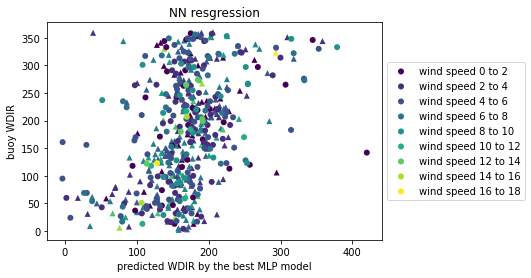

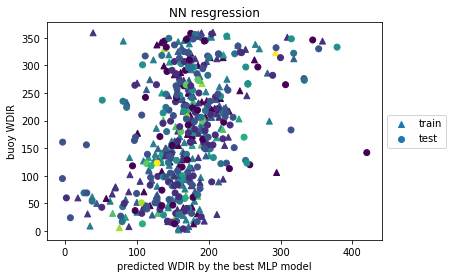

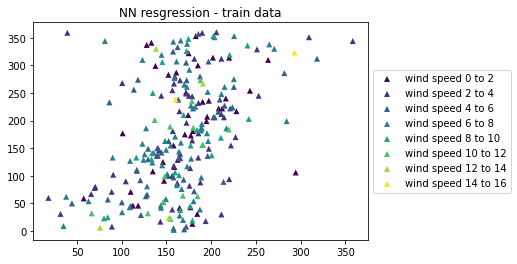

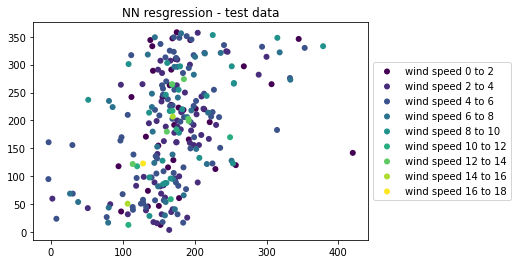



***incidence angle*** 



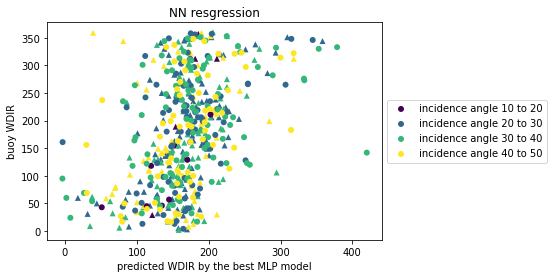

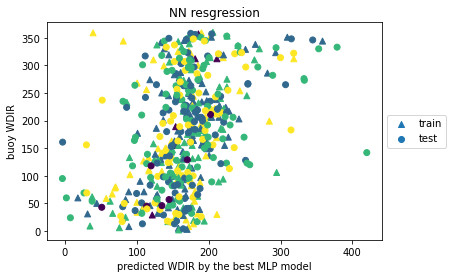

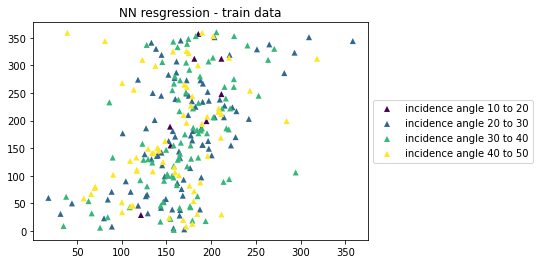

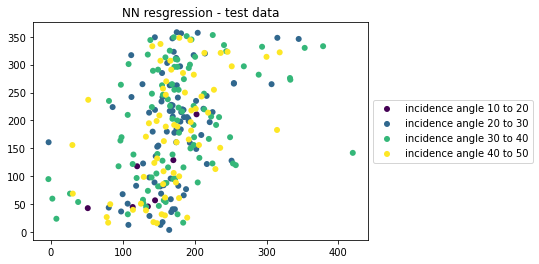



***ENL_HH*** 



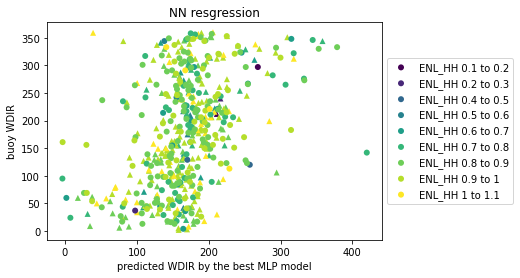

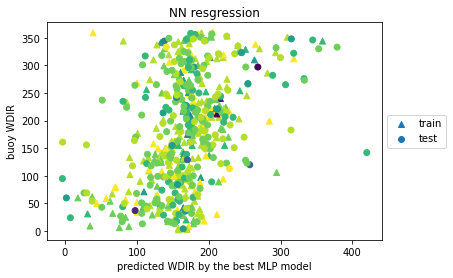

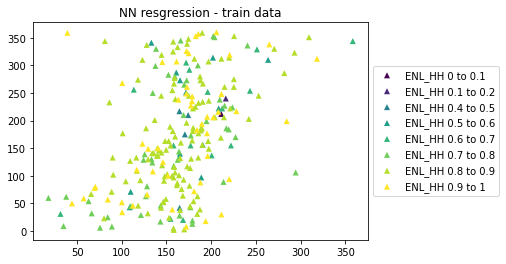

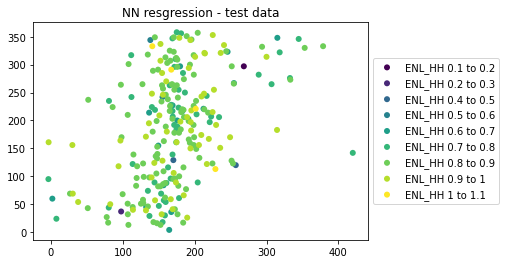



***ENL_HV*** 



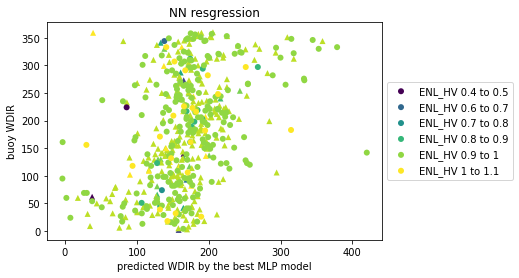

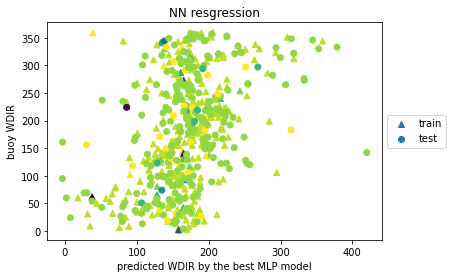

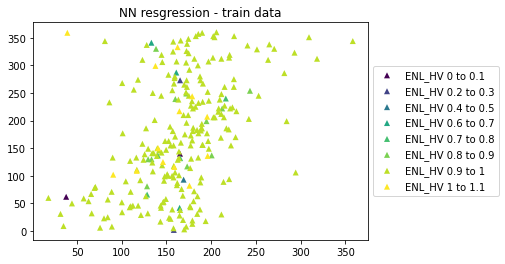

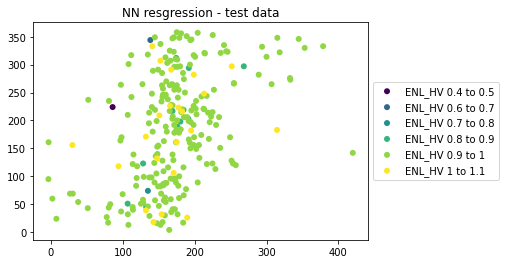



***ENL_VV*** 



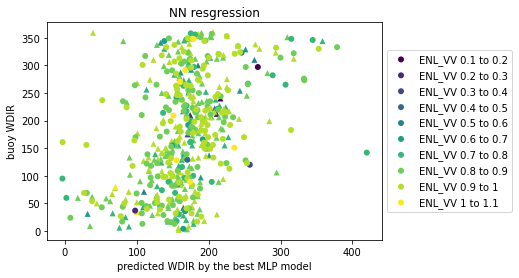

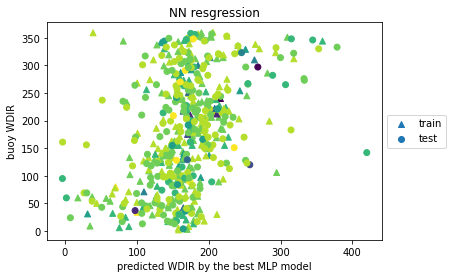

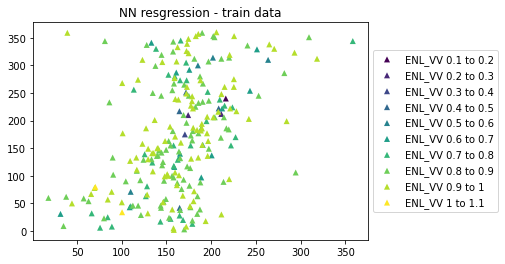

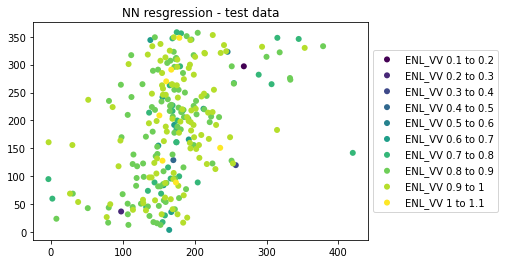



***noise*** 



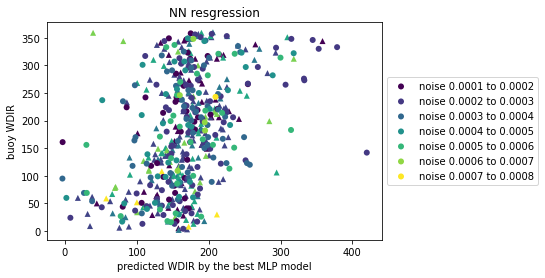

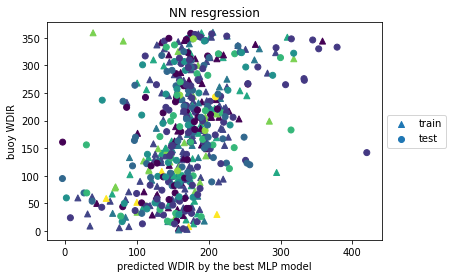

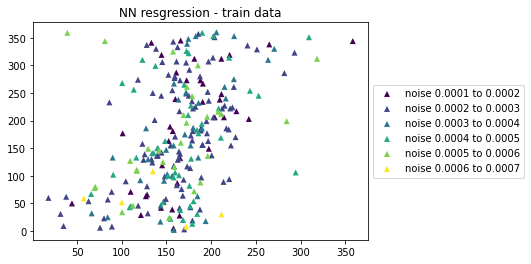

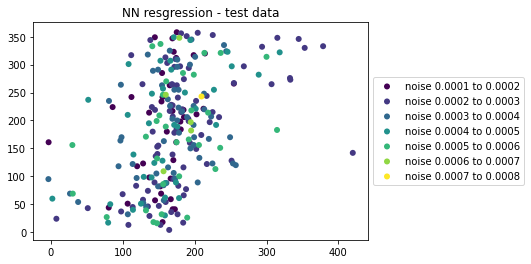



***buoy_PRES*** 



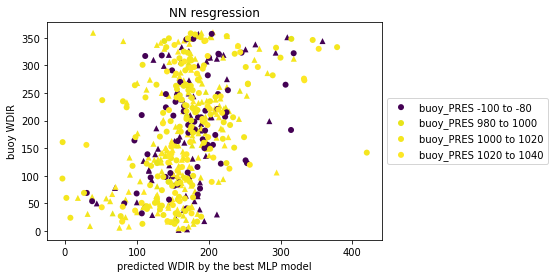

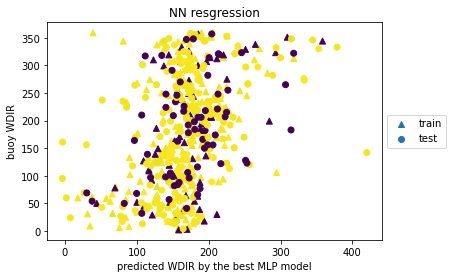

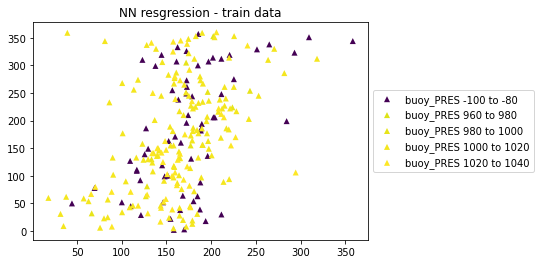

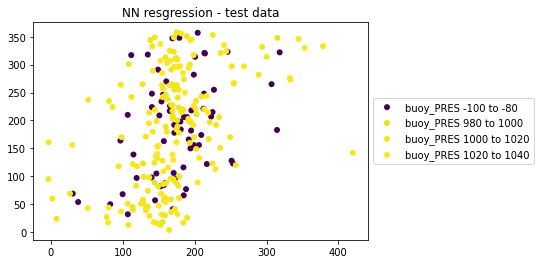



***buoy_DPD*** 



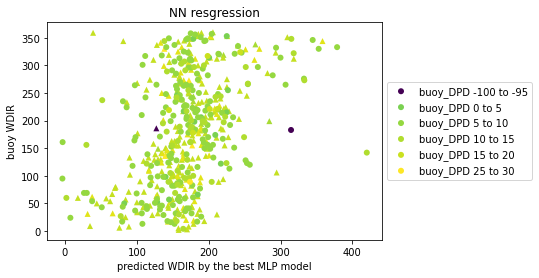

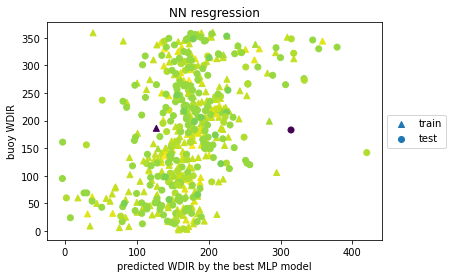

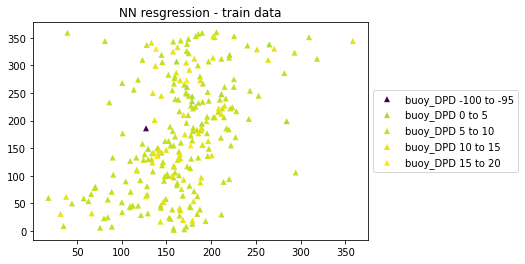

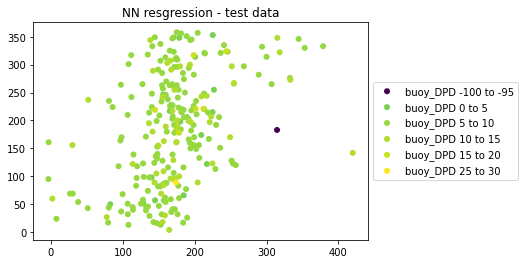



***buoy_SST*** 



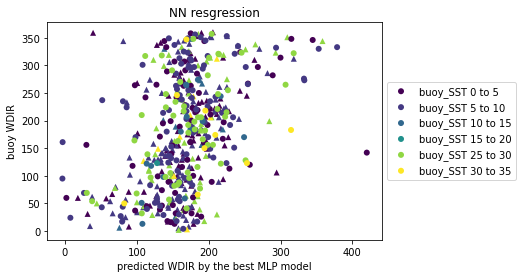

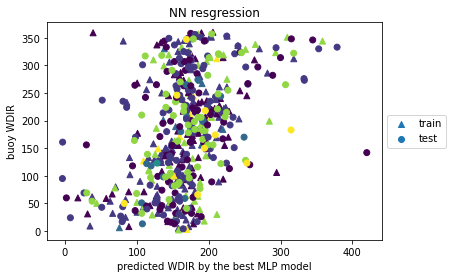

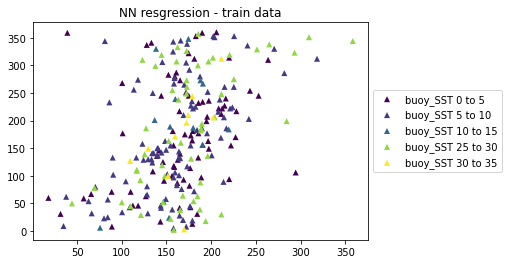

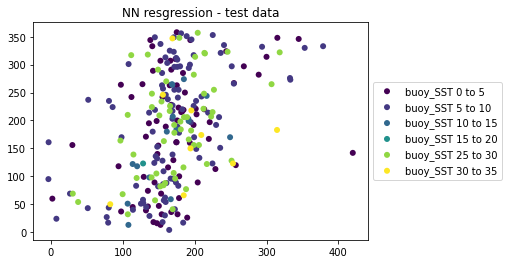



***buoy_DEWP*** 



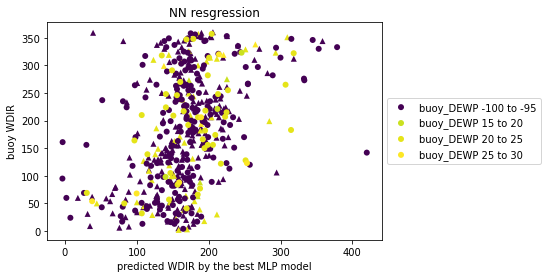

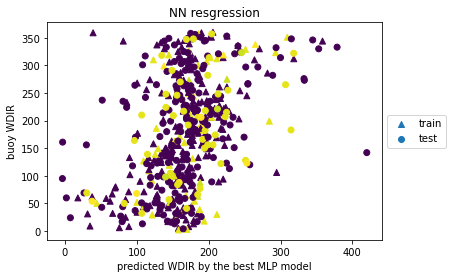

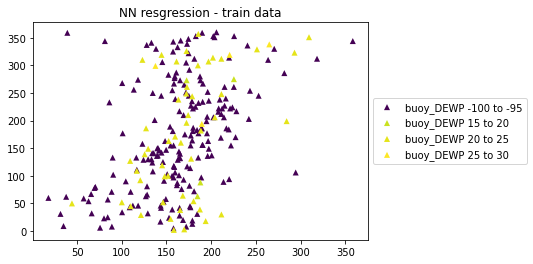

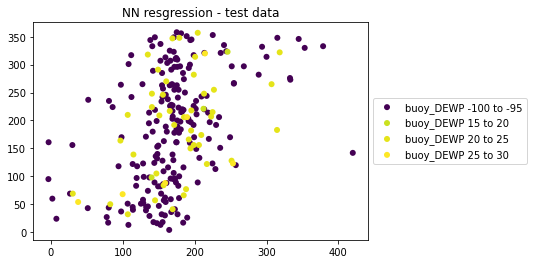



***buoy_ATMP*** 



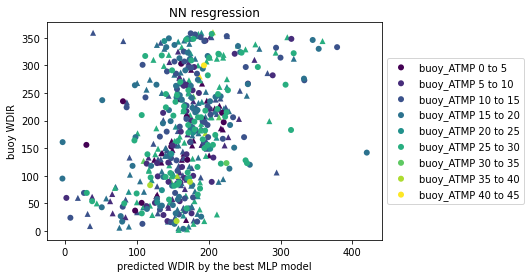

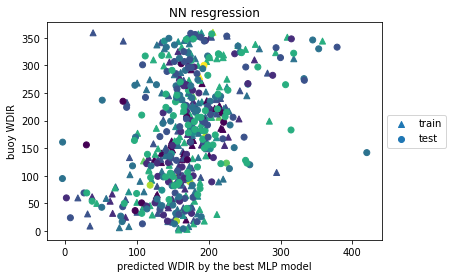

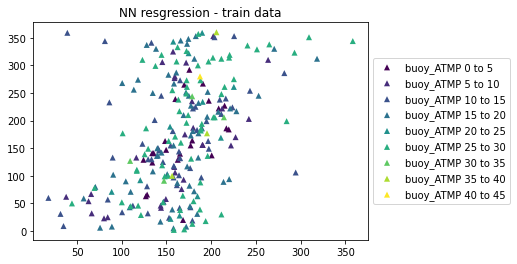

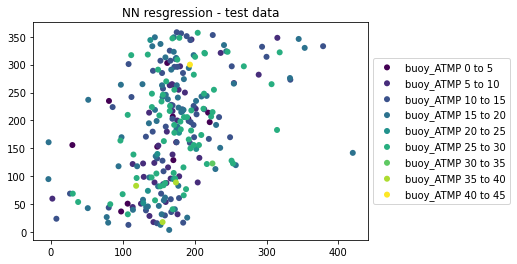



***buoy_longitude*** 



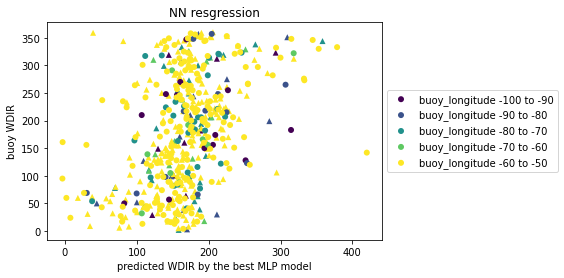

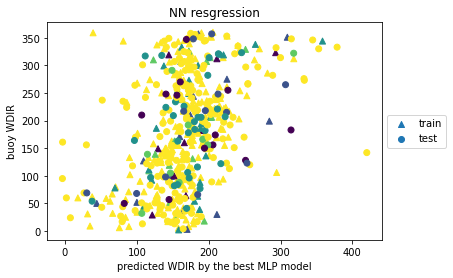

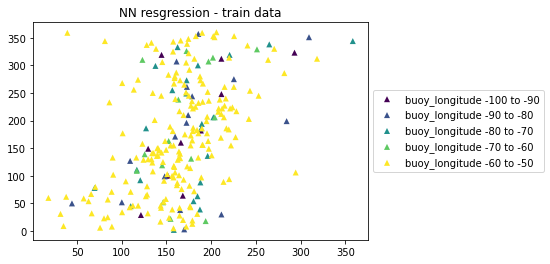

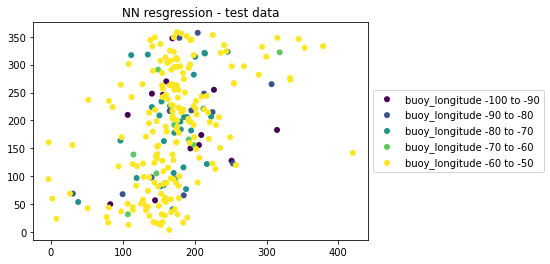



***buoy_latitude*** 



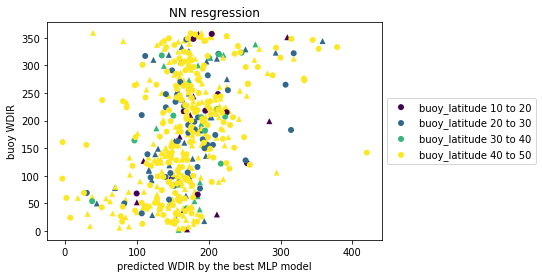

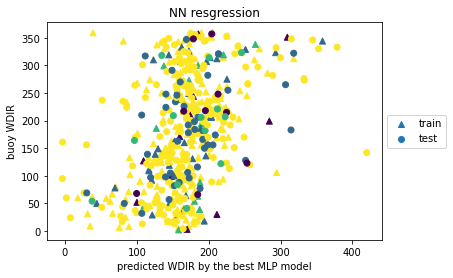

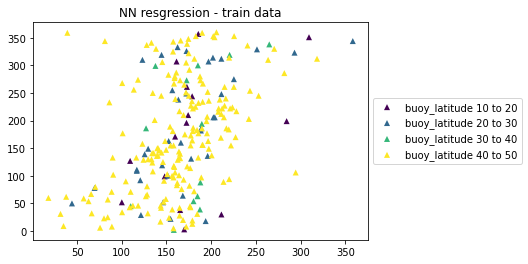

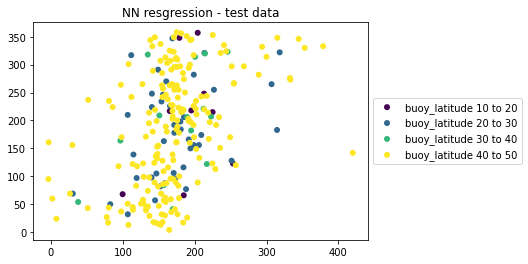



***rs2_month*** 



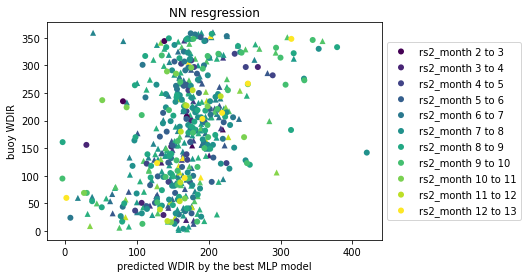

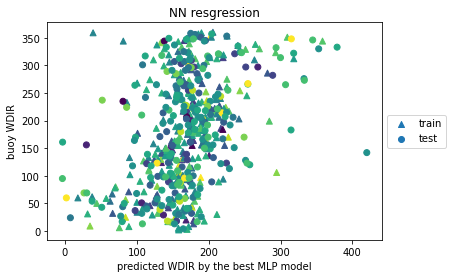

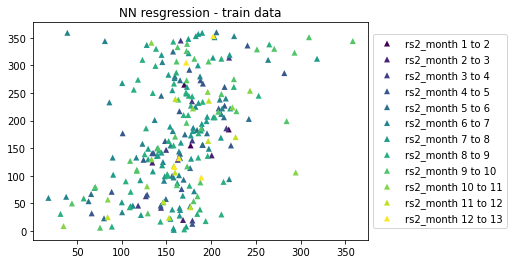

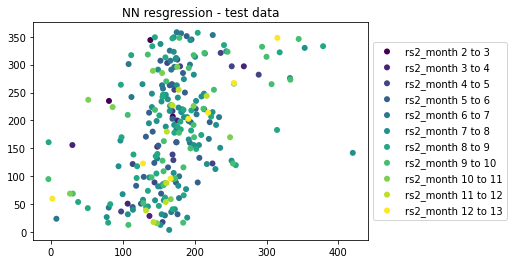



***rs2_year*** 



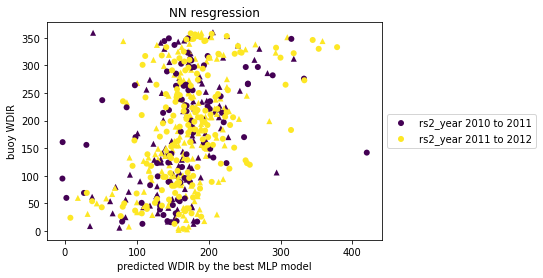

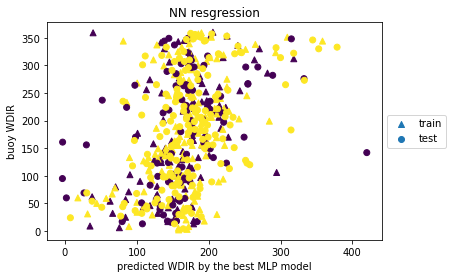

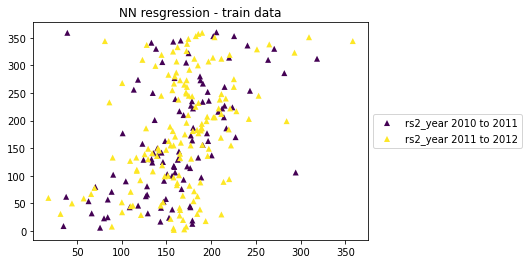

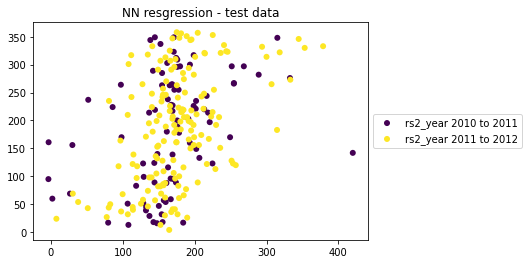



***RS2_day_of_year*** 



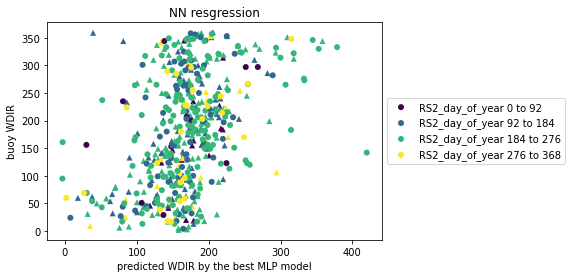

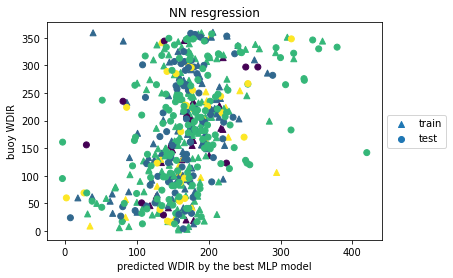

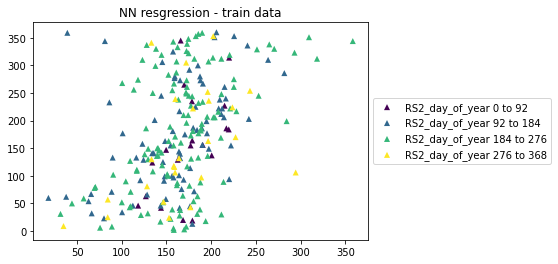

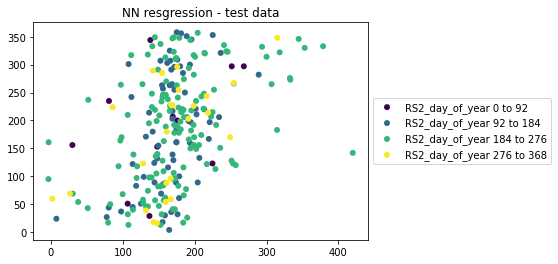




 
Best fold number: 2
Best model rmse: 93.247
Best model mae: 76.565
Best model r2: 0.118
Best model cc: 0.415
Best model parameters: {'optimizer': 'Adam', 'neurons_2': 30, 'neurons_1': 60, 'epochs': 500, 'activation_2': 'relu', 'activation_1': 'relu'} 
 

INFO:tensorflow:Assets written to: ram://caf6fb3b-ca9a-48e3-b29f-dbe59f52605e/assets
INFO:tensorflow:Assets written to: ram://21354599-3366-4541-a954-7ef3137cd595/assets
INFO:tensorflow:Assets written to: ram://565cb4c7-ed2a-41fb-975f-b789655bfdca/assets
INFO:tensorflow:Assets written to: ram://0d62b845-b28f-43a2-bfc5-d084a91c18d4/assets
INFO:tensorflow:Assets written to: ram://cd1130be-d581-47c3-9864-2fa8706a54e5/assets
INFO:tensorflow:Assets written to: ram://a8b916ef-f782-49ac-8da3-84735a0b08f9/assets
INFO:tensorflow:Assets written to: ram://1b886948-cd8b-461c-9855-b7857b49a562/assets
INFO:tensorflow:Assets written to: ram://6b20bc77-3933-4525-96c3-4f412263e8f3/assets
INFO:tensorflow:Assets written to: ram://f2758ee1-edfa-4319-

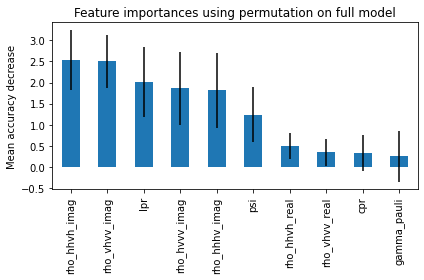

statistics 



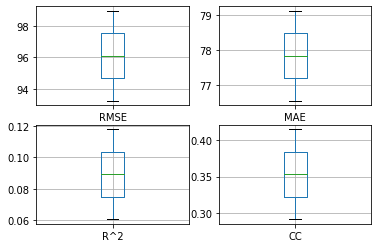


 
Final, out of sample rmse: 96.1357698793755
Final, out of sample mean absolute error: 77.84638479316659
Final, out of sample r2: 0.09158821580511567
Final, out of sample correlation coefficient: 0.3499944862780616 
 


 ***** random forest *****

 Fold #1


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetri


 Fold #2


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetri



train size:
(253, 1)
test size:
(253, 1)


***wind speed*** 



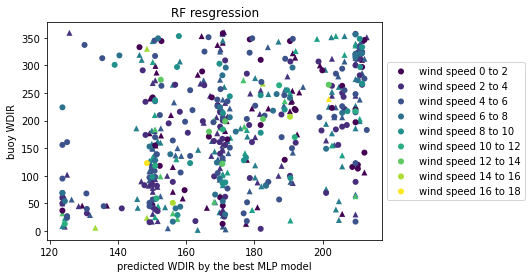

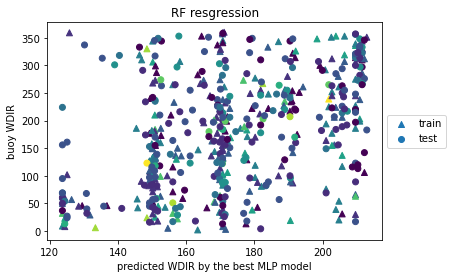

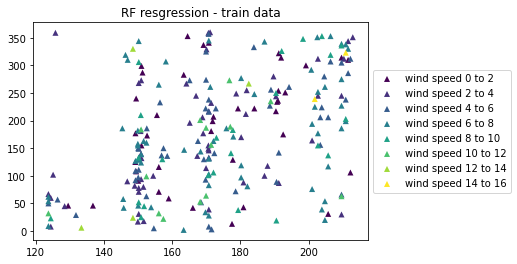

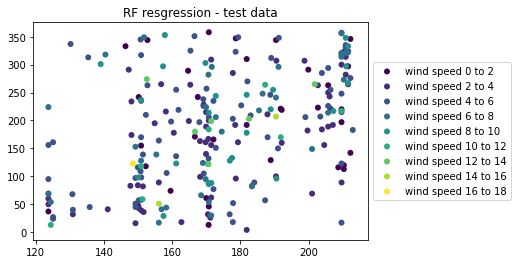



***incidence angle*** 



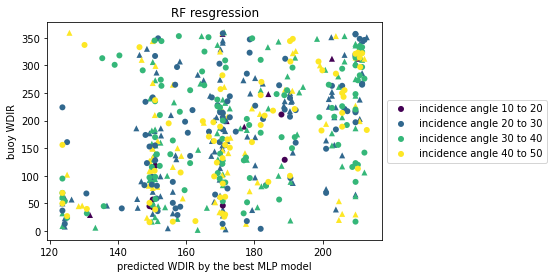

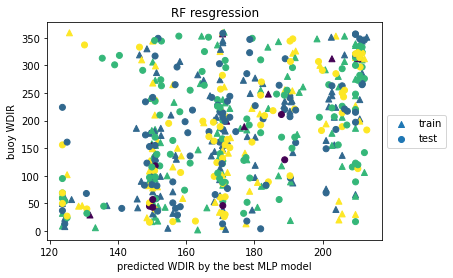

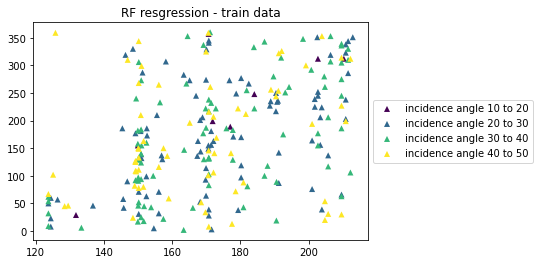

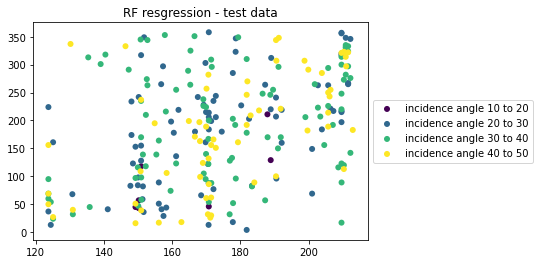



***ENL_HH*** 



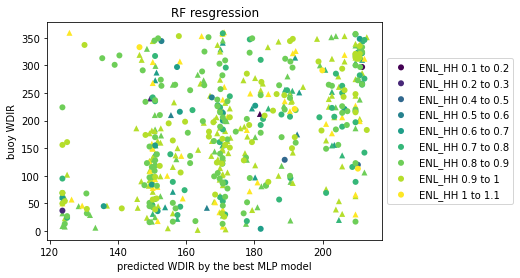

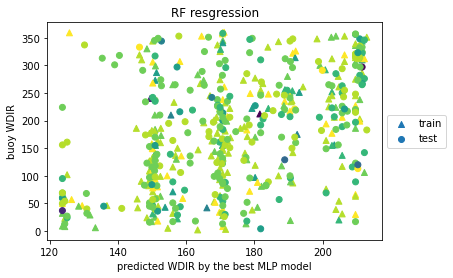

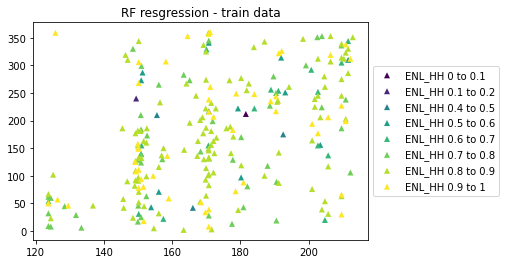

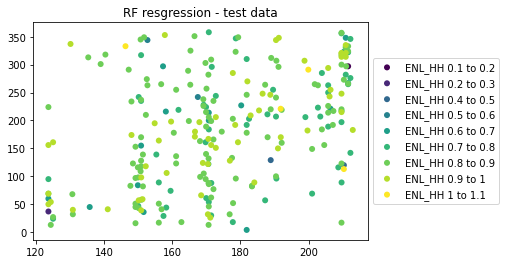



***ENL_HV*** 



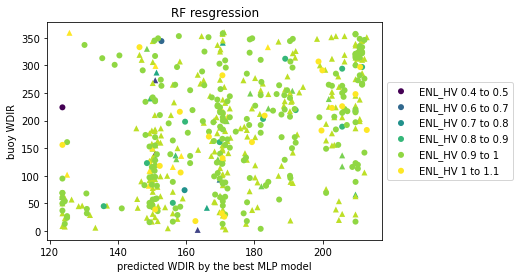

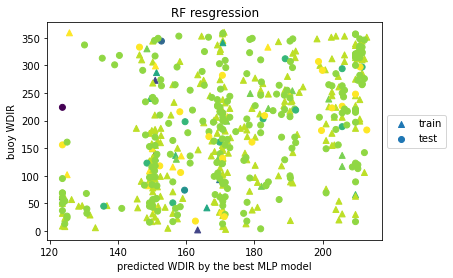

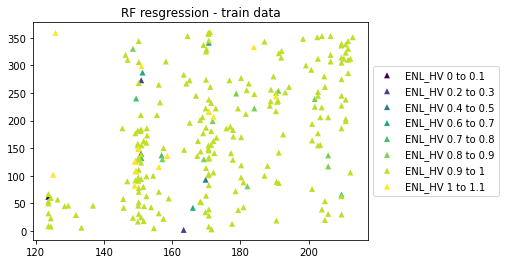

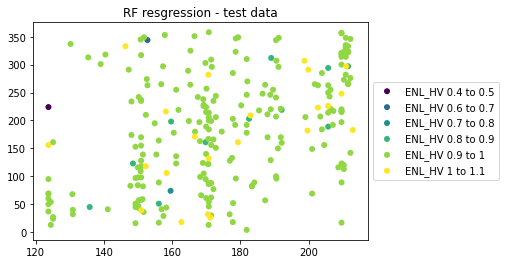



***ENL_VV*** 



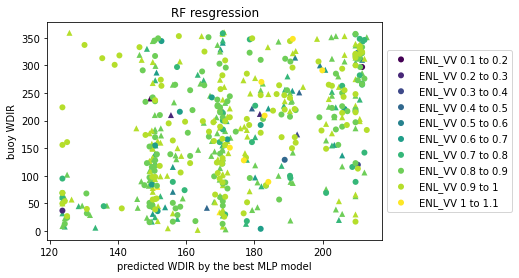

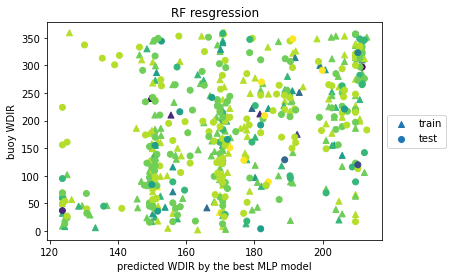

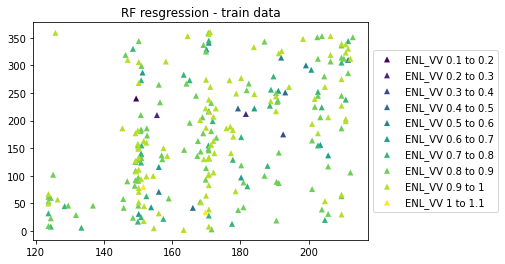

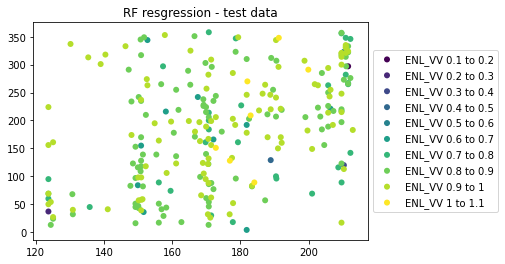



***noise*** 



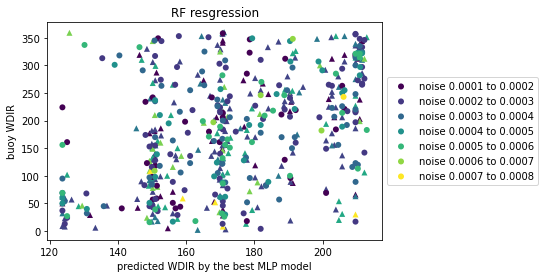

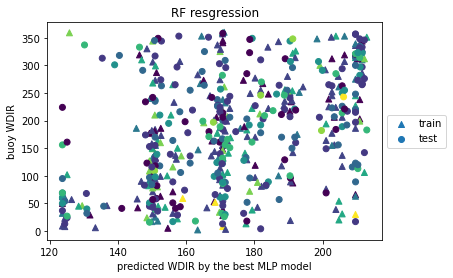

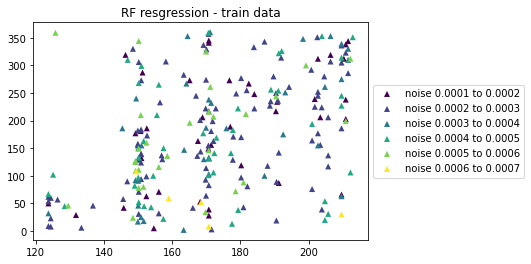

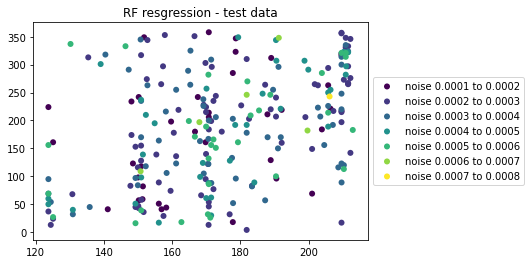



***buoy_PRES*** 



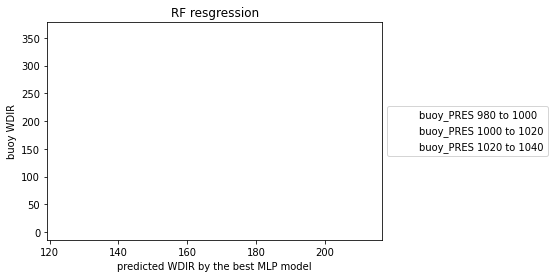

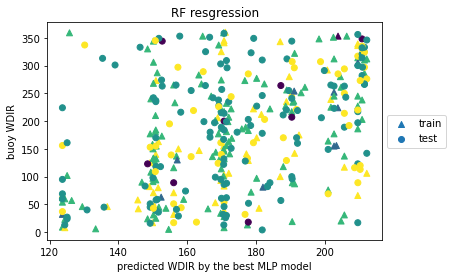

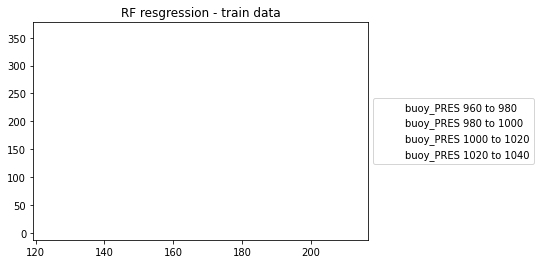

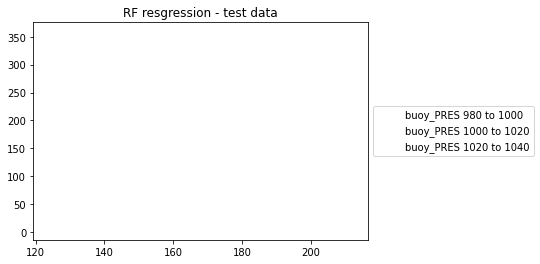



***buoy_DPD*** 



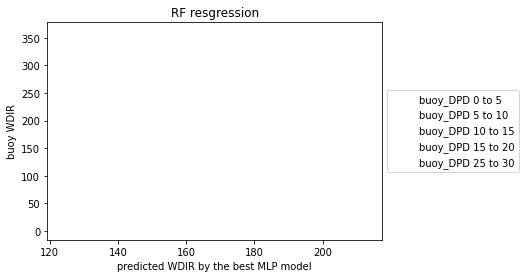

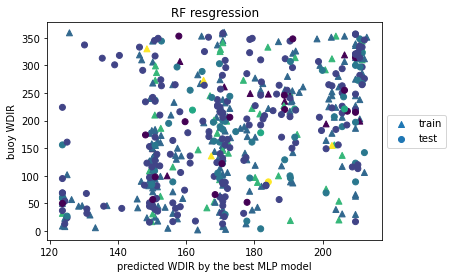

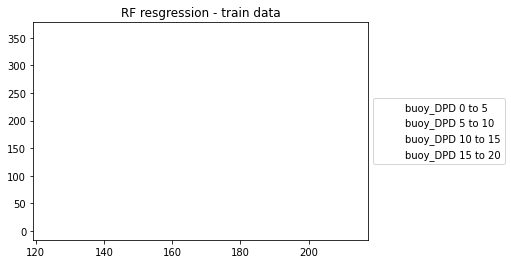

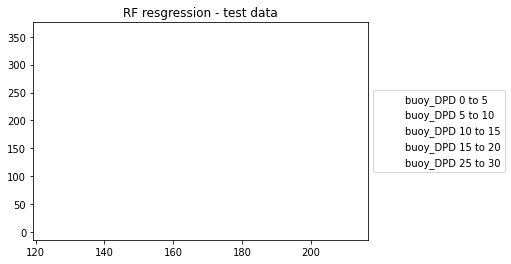



***buoy_SST*** 



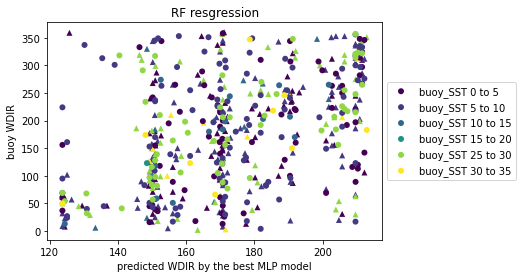

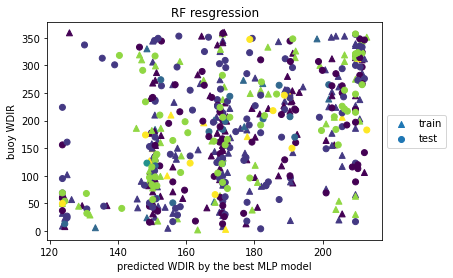

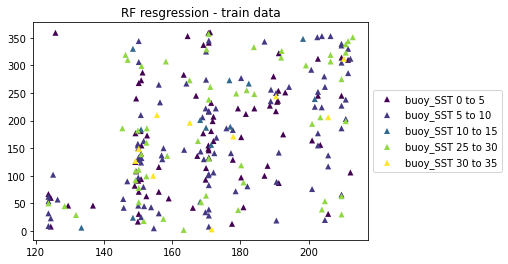

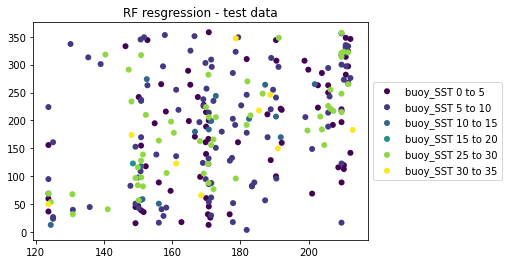



***buoy_DEWP*** 



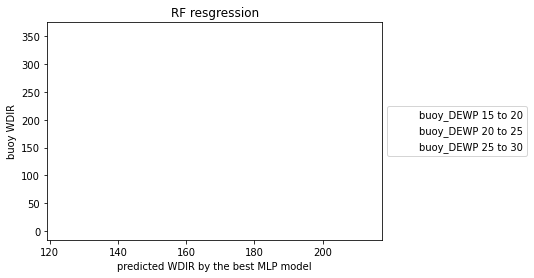

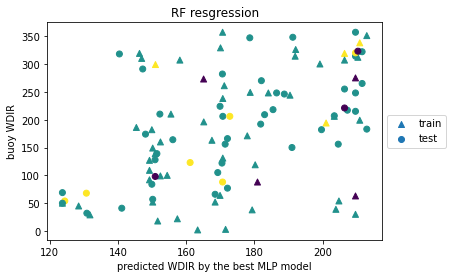

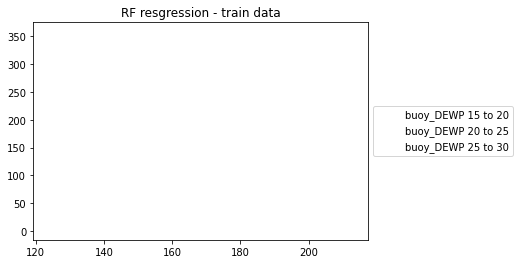

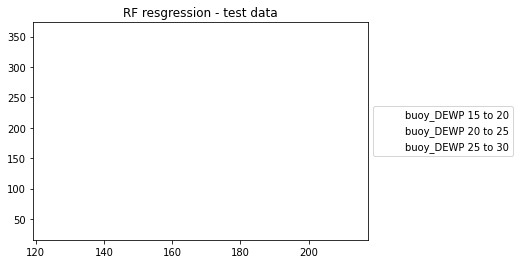



***buoy_ATMP*** 



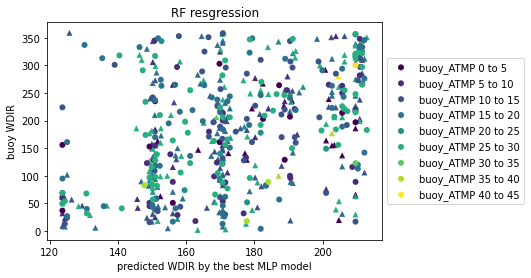

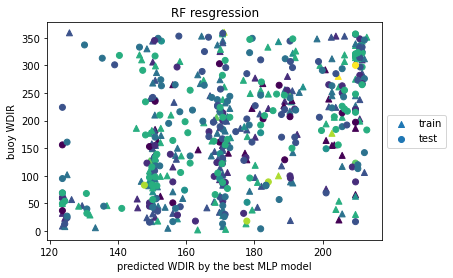

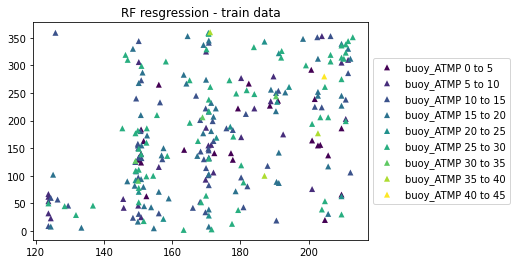

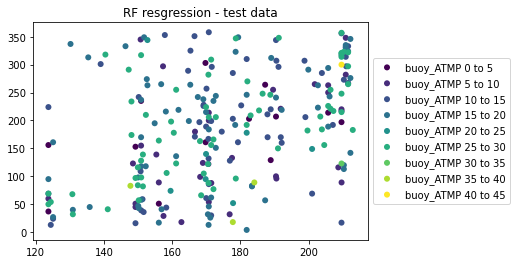



***buoy_longitude*** 



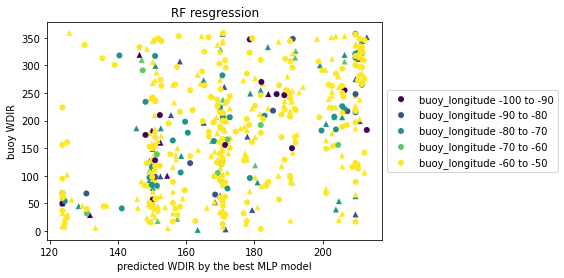

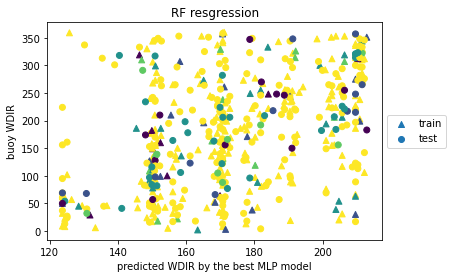

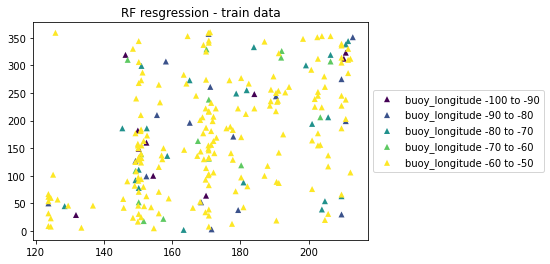

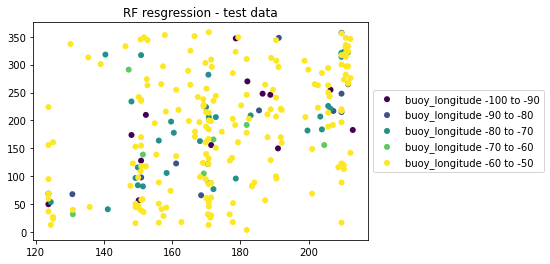



***buoy_latitude*** 



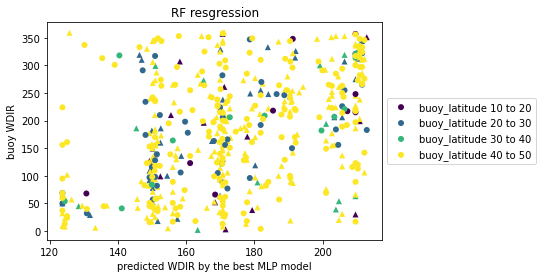

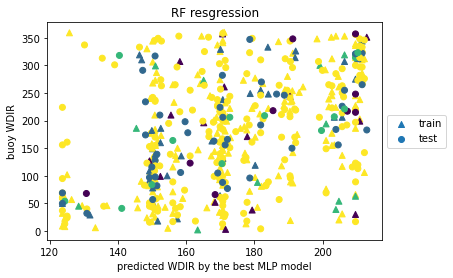

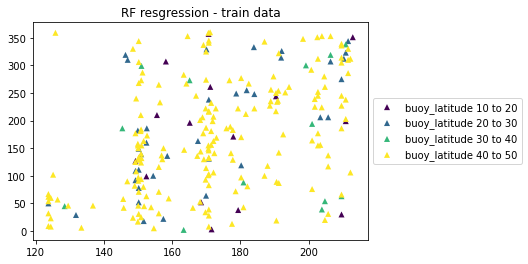

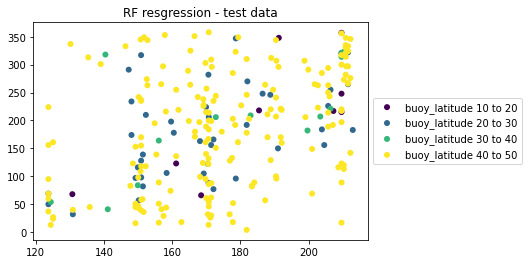



***rs2_month*** 



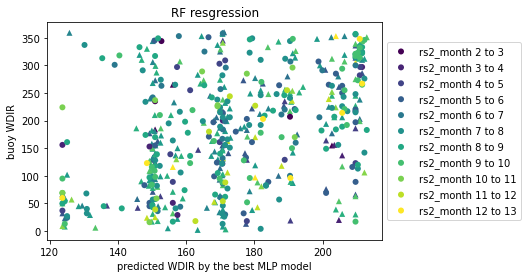

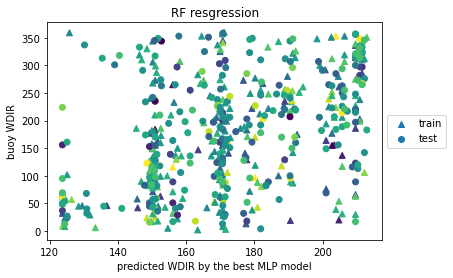

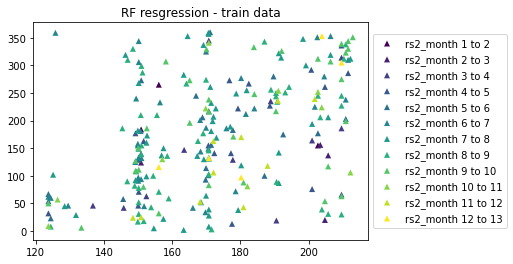

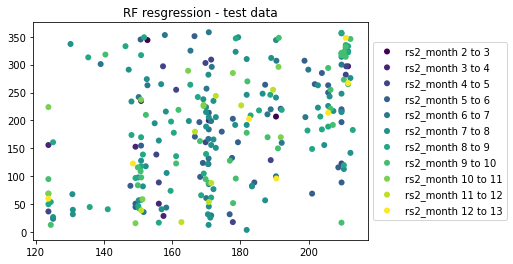



***rs2_year*** 



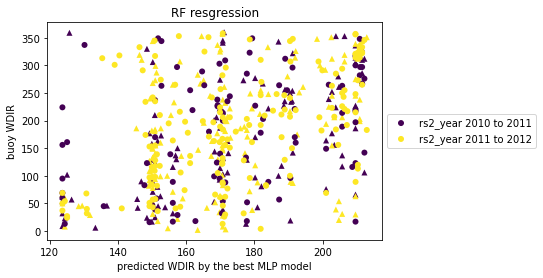

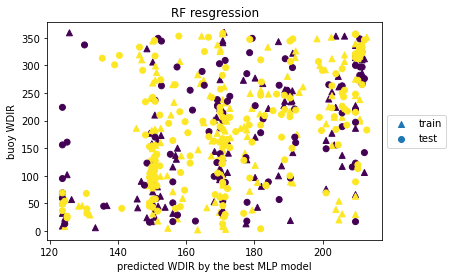

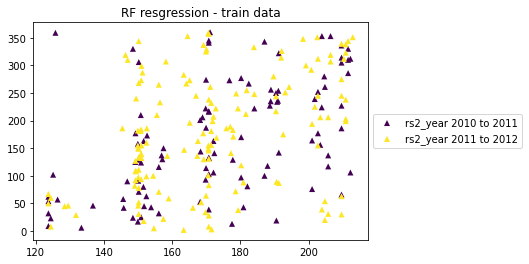

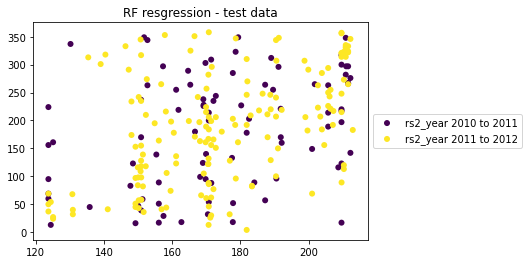



***RS2_day_of_year*** 



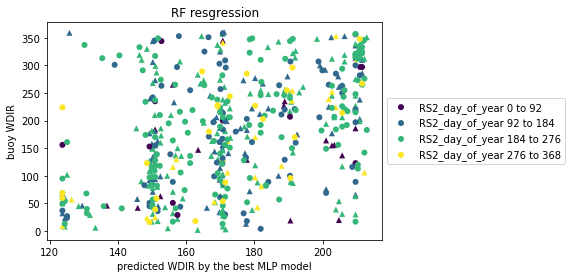

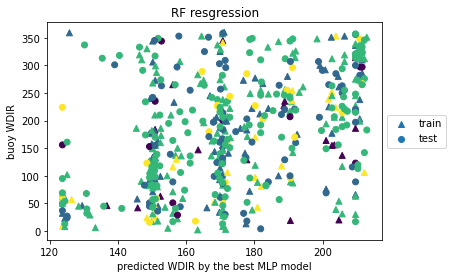

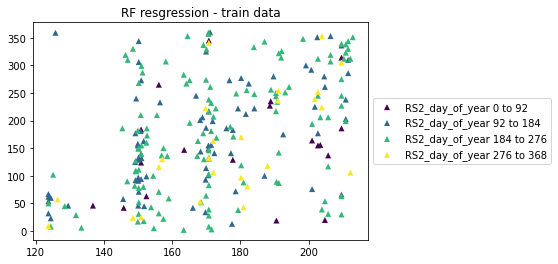

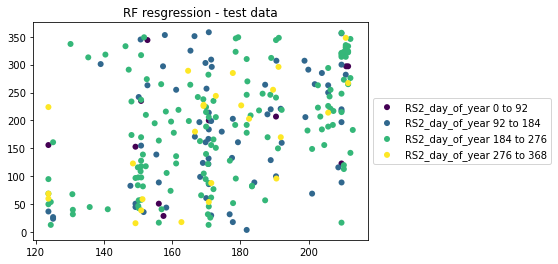




 
Best fold number: 2
Best model rmse: 92.136
Best model mae: 77.668
Best model r2: 0.139
Best model cc: 0.425
Best model parameters: {'bootstrap': True, 'max_depth': 1, 'min_samples_leaf': 8, 'min_samples_split': 8, 'n_estimators': 98} 
 


 



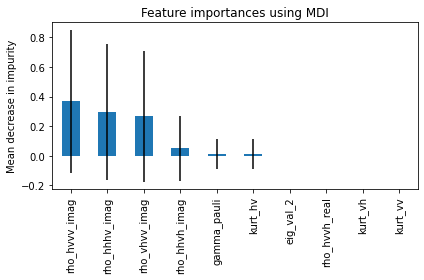

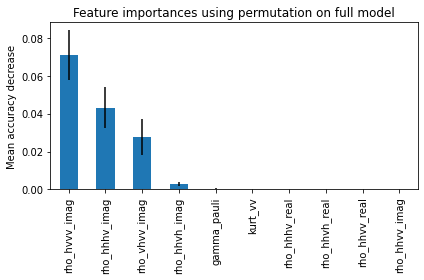


 
statistics 



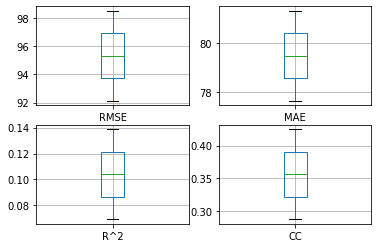


 
Final, out of sample rmse: 95.37036564156153
Final, out of sample mean absolute error: 79.48662965814347
Final, out of sample r2: 0.10599563847427396
Final, out of sample correlation coefficient: 0.3259135018552473 
 

**********bin_number: 2**********
Incidence angle range: 19 to 51
Wind speed range: 6 to 20
sample size: 394

 ***** neural network *****
Fold #1


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:447: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_search.py:296: UserWarning: The total space of parameters 1 is smaller than n_iter=19. Running 1 iterations. For exhaustive searches, use GridSearchCV.
  UserWarning,


Fold #2


/usr/local/lib/python3.7/dist-packages/ipykernel_launcher.py:447: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
/usr/local/lib/python3.7/dist-packages/sklearn/model_selection/_search.py:296: UserWarning: The total space of parameters 1 is smaller than n_iter=19. Running 1 iterations. For exhaustive searches, use GridSearchCV.
  UserWarning,




train size:
(197, 1)
test size:
(197, 1)


***wind speed*** 



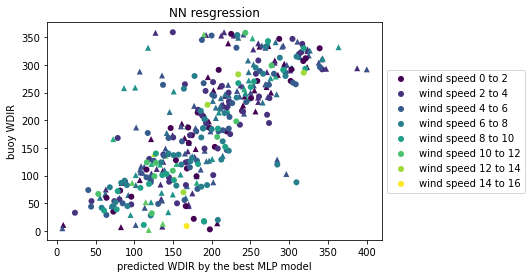

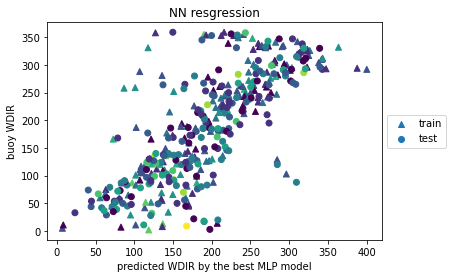

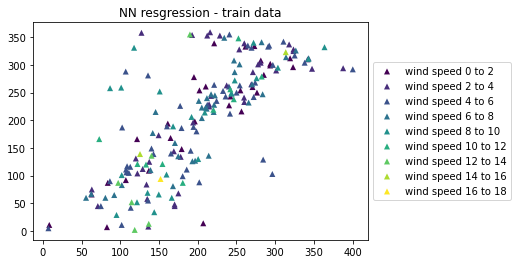

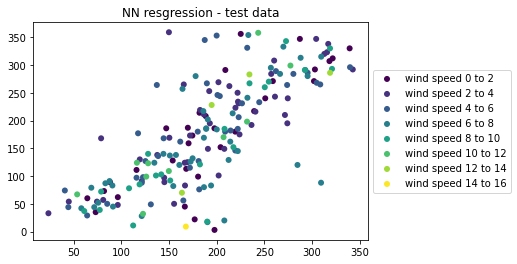



***incidence angle*** 



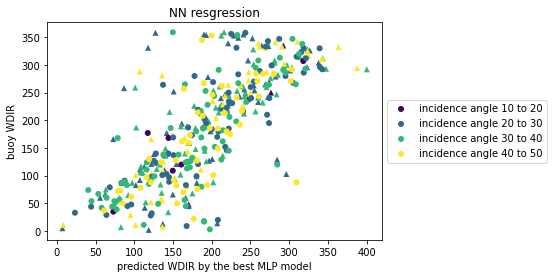

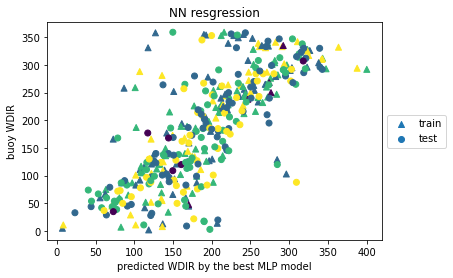

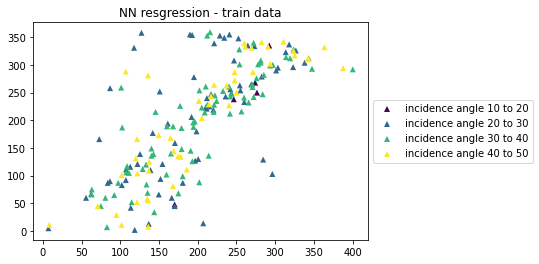

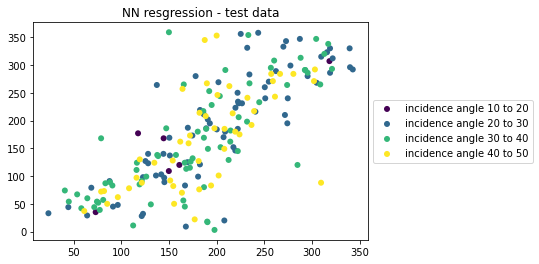



***ENL_HH*** 



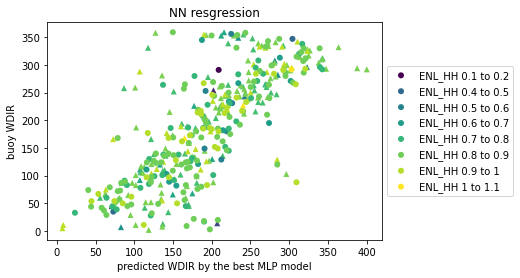

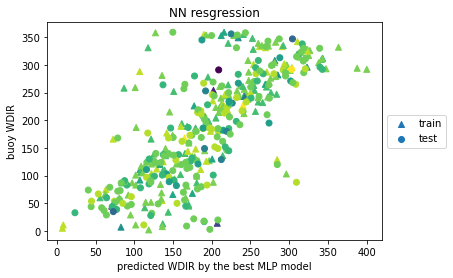

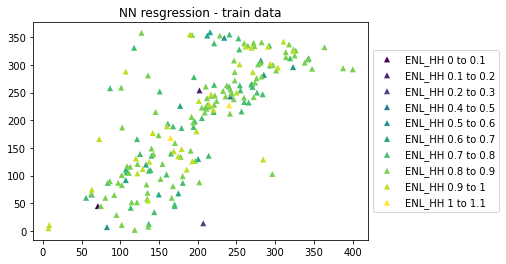

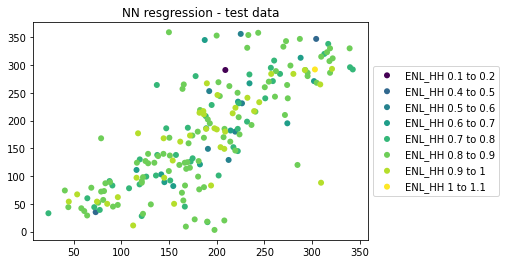



***ENL_HV*** 



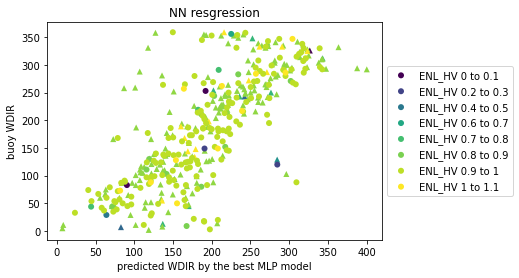

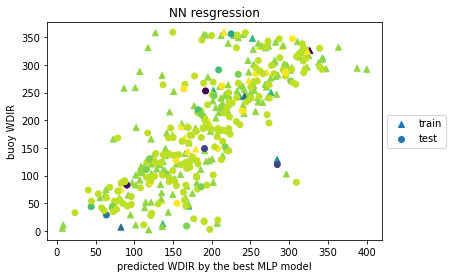

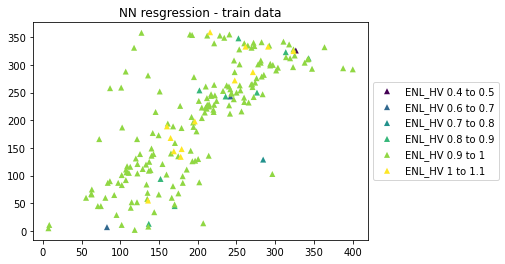

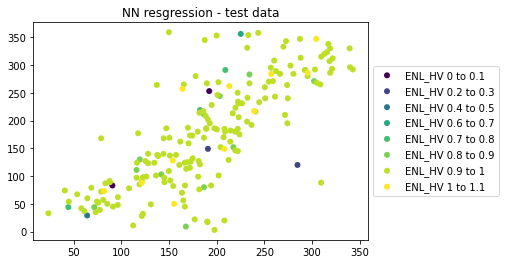



***ENL_VV*** 



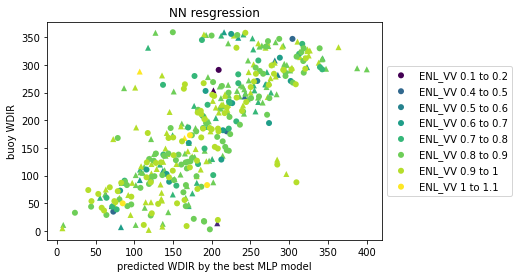

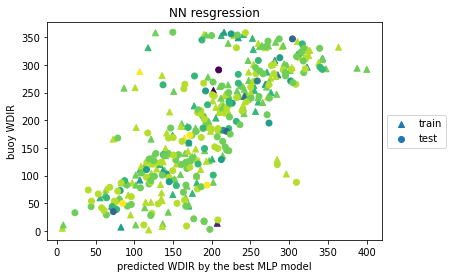

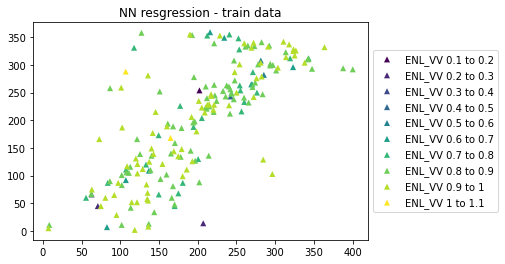

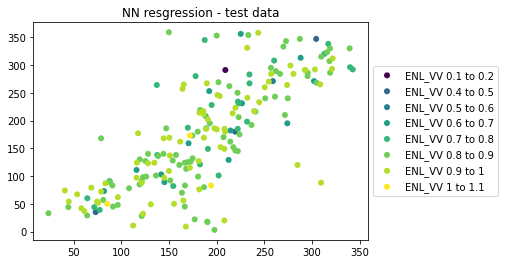



***noise*** 



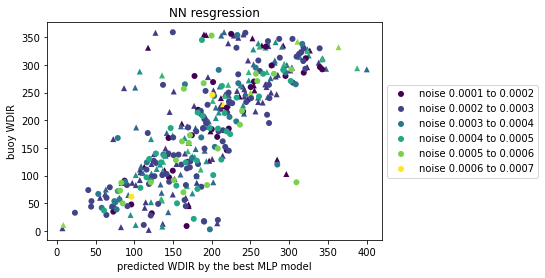

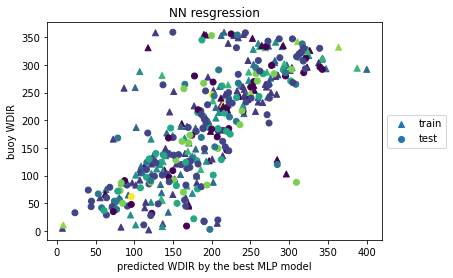

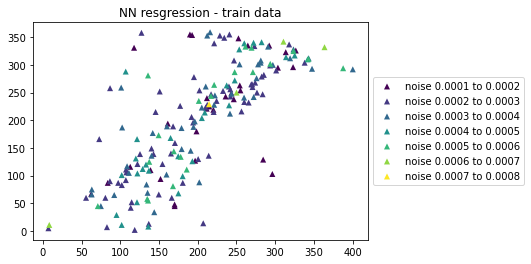

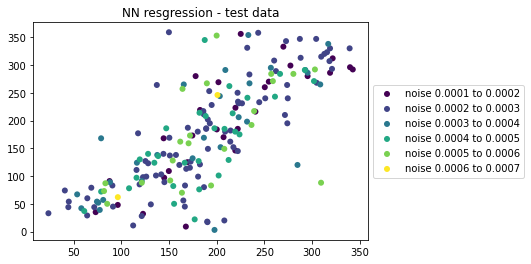



***buoy_PRES*** 



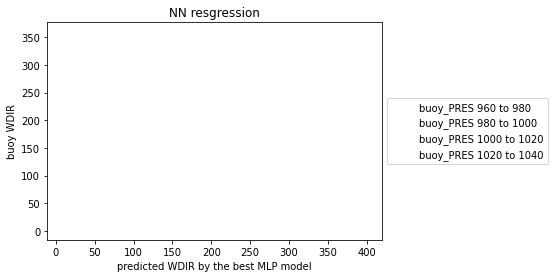

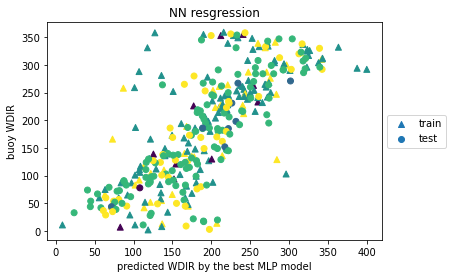

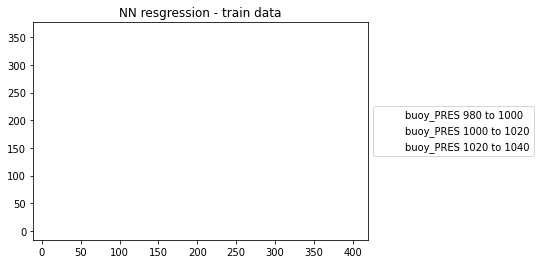

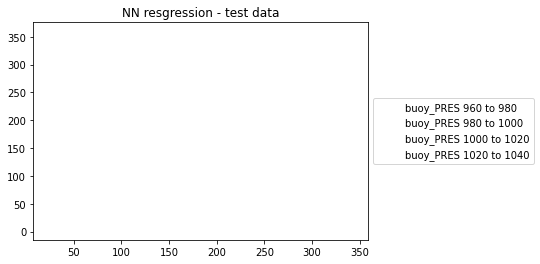



***buoy_DPD*** 



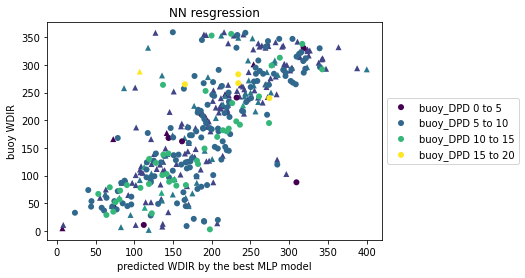

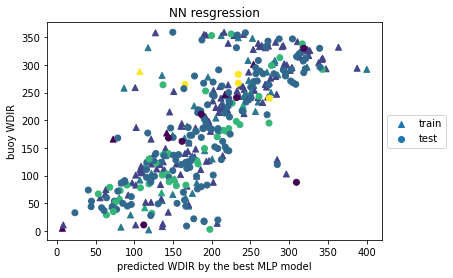

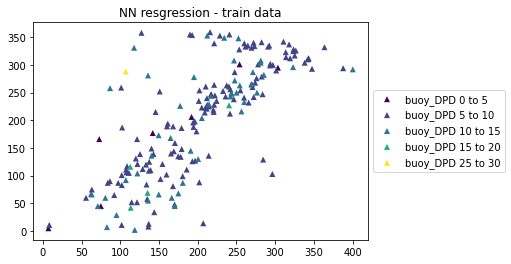

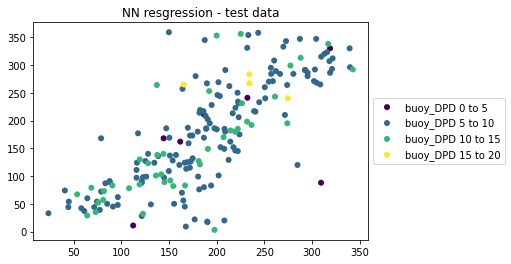



***buoy_SST*** 



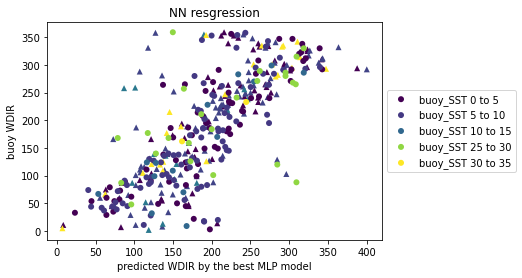

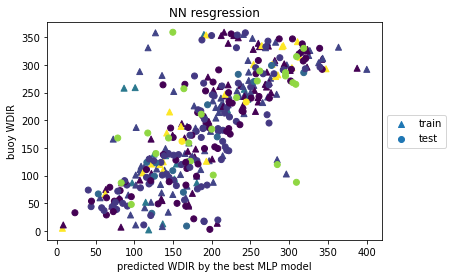

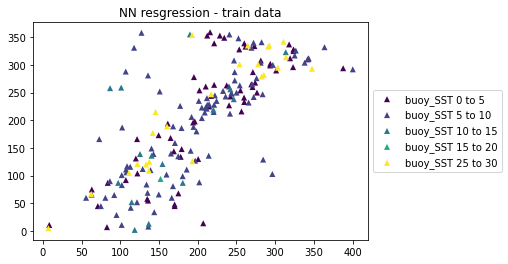

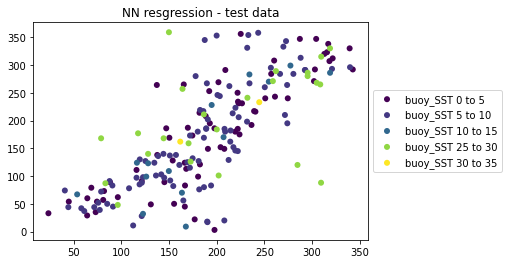



***buoy_DEWP*** 



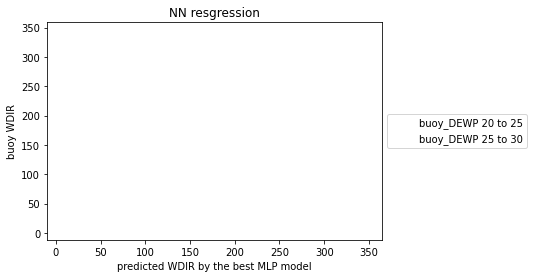

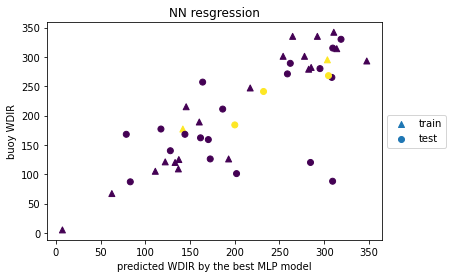

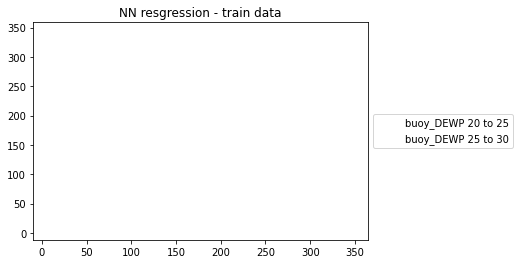

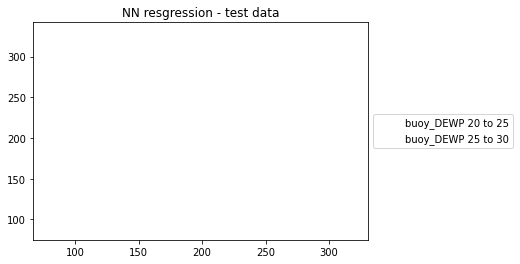



***buoy_ATMP*** 



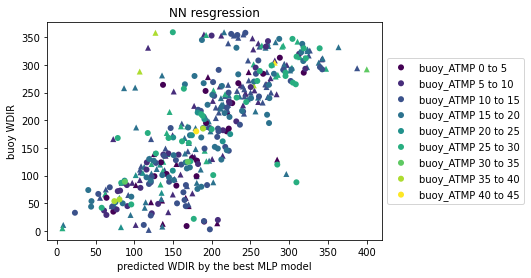

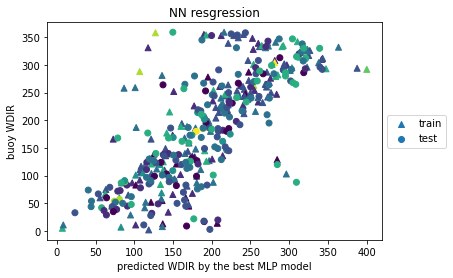

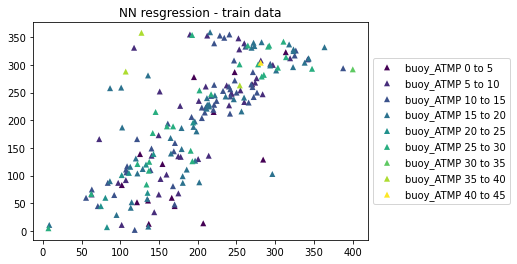

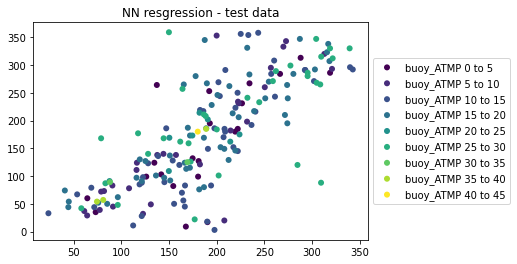



***buoy_longitude*** 



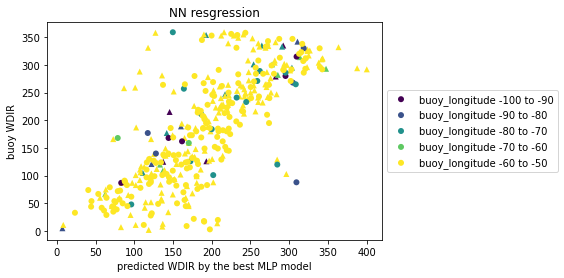

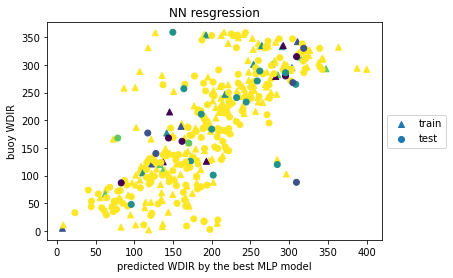

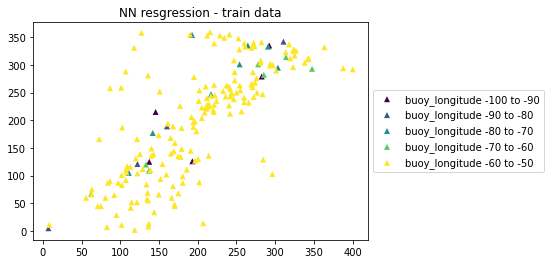

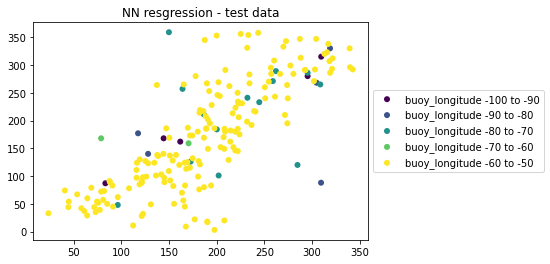



***buoy_latitude*** 



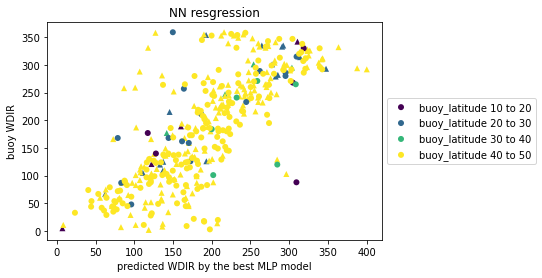

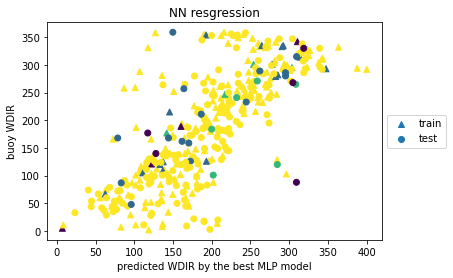

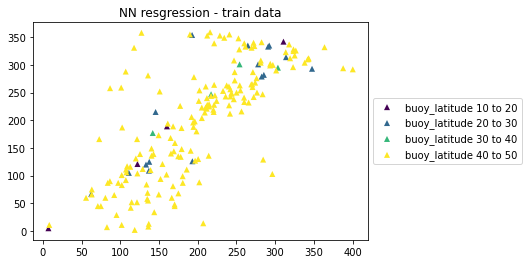

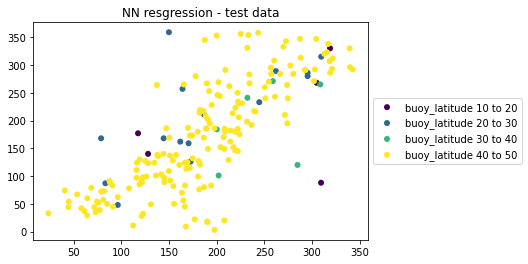



***rs2_month*** 



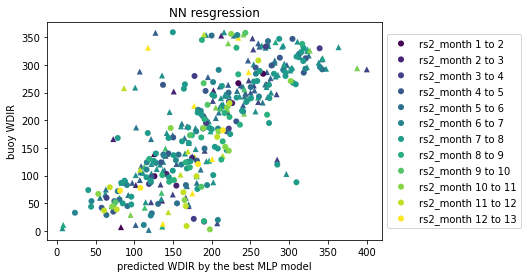

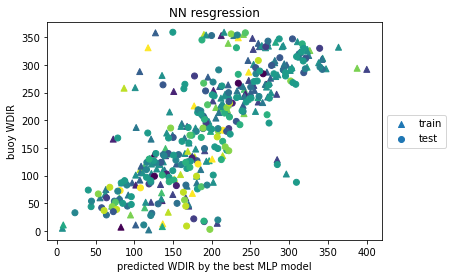

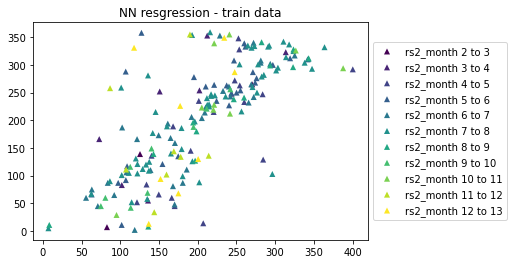

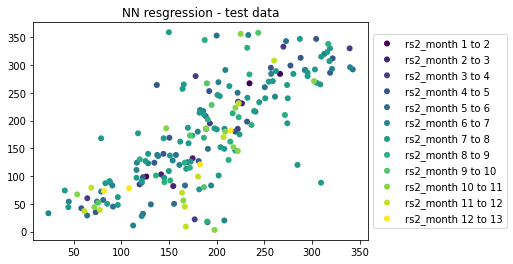



***rs2_year*** 



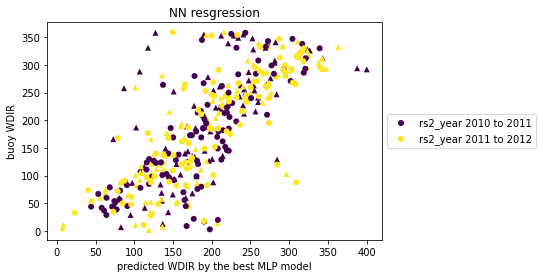

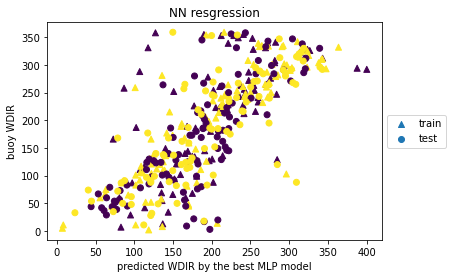

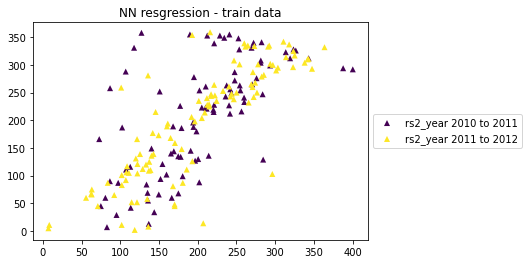

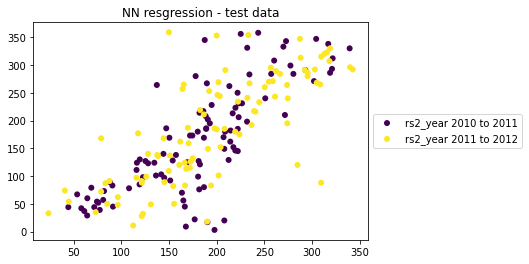



***RS2_day_of_year*** 



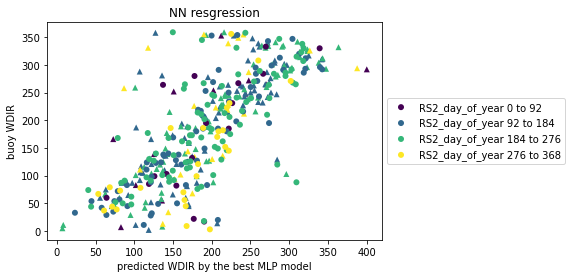

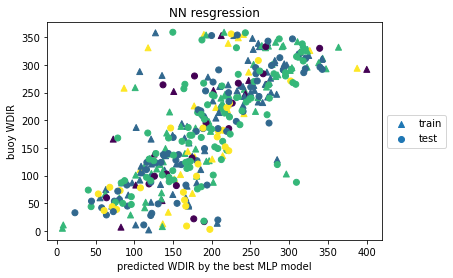

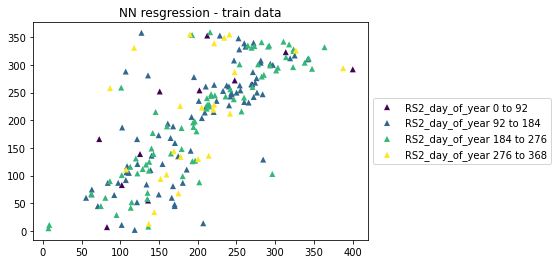

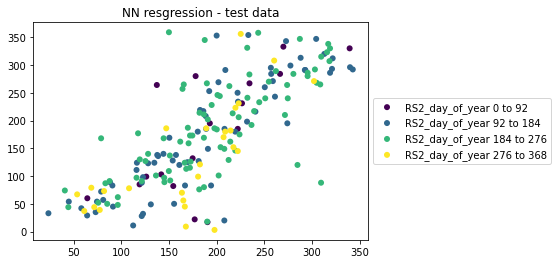




 
Best fold number: 1
Best model rmse: 63.636
Best model mae: 45.265
Best model r2: 0.566
Best model cc: 0.766
Best model parameters: {'optimizer': 'Adam', 'neurons_2': 30, 'neurons_1': 60, 'epochs': 500, 'activation_2': 'relu', 'activation_1': 'relu'} 
 

INFO:tensorflow:Assets written to: ram://96d617fc-629e-43ff-8672-1534f624c1fd/assets
INFO:tensorflow:Assets written to: ram://3a1ceefb-91e1-4db5-89fe-eb7e488a327e/assets
INFO:tensorflow:Assets written to: ram://4b127afb-3fd0-41f8-a7fc-af7cf53b5733/assets
INFO:tensorflow:Assets written to: ram://94b889e5-edac-472e-afcc-9754437716a4/assets
INFO:tensorflow:Assets written to: ram://651d0422-75fa-40be-98f4-7ad217a9f5ea/assets
INFO:tensorflow:Assets written to: ram://37b2c717-341c-4d57-94b7-26b7400f6d03/assets
INFO:tensorflow:Assets written to: ram://cba654d1-cbb6-409e-981f-655d3fab529f/assets
INFO:tensorflow:Assets written to: ram://f786ca98-c97f-4f07-9168-319ba2f90e5a/assets
INFO:tensorflow:Assets written to: ram://0088fa62-be47-497f-

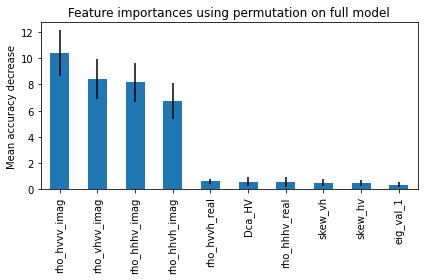

statistics 



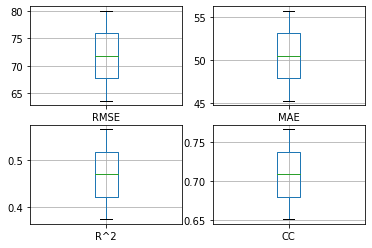


 
Final, out of sample rmse: 72.26700031840278
Final, out of sample mean absolute error: 50.4961967710311
Final, out of sample r2: 0.4747457152939212
Final, out of sample correlation coefficient: 0.6971153490784846 
 


 ***** random forest *****

 Fold #1


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetri


 Fold #2


/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetricWarning)
/usr/local/lib/python3.7/dist-packages/sklearn/metrics/_regression.py:796: UndefinedMetricWarning: R^2 score is not well-defined with less than two samples.
  warnings.warn(msg, UndefinedMetri



train size:
(197, 1)
test size:
(197, 1)


***wind speed*** 



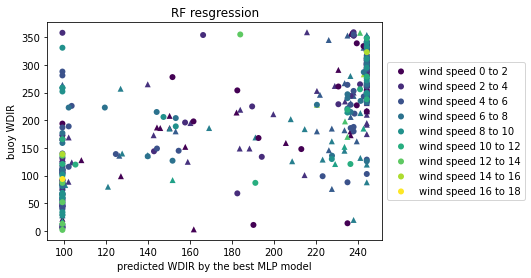

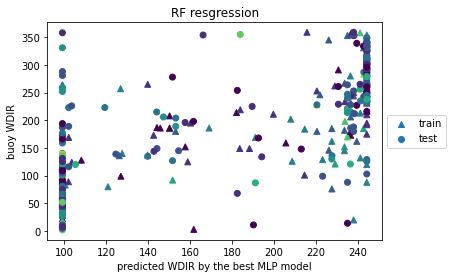

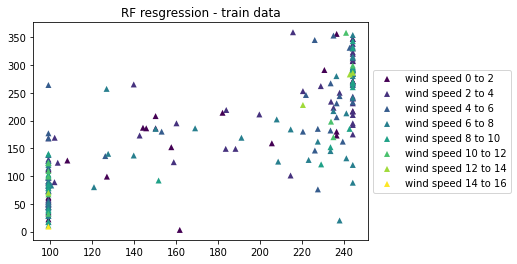

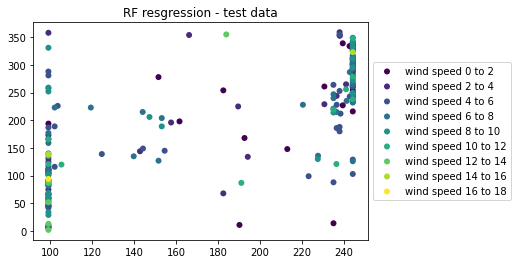



***incidence angle*** 



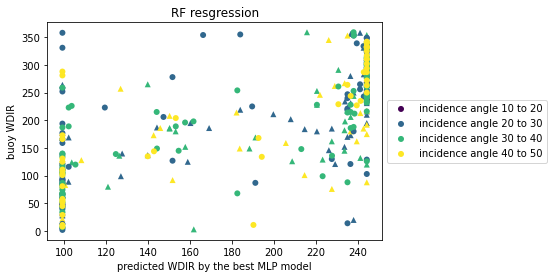

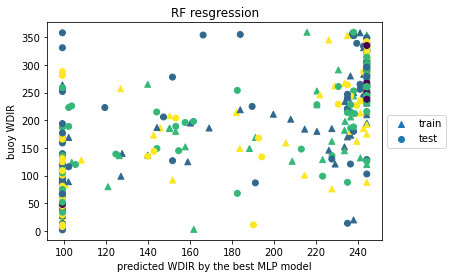

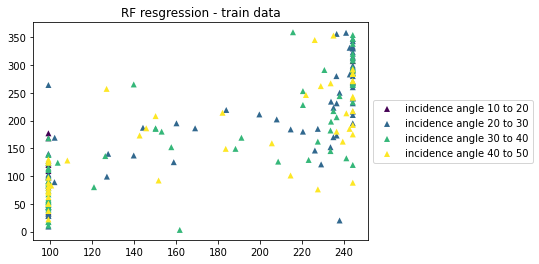

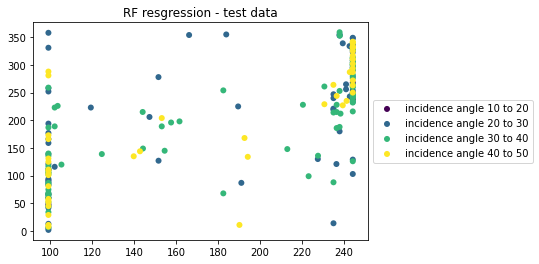



***ENL_HH*** 



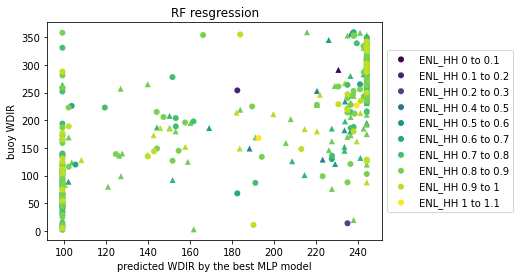

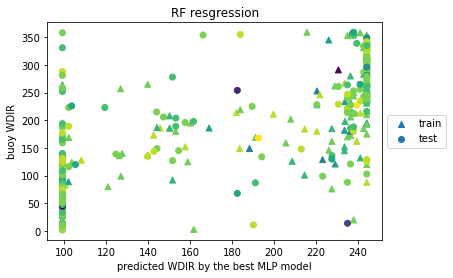

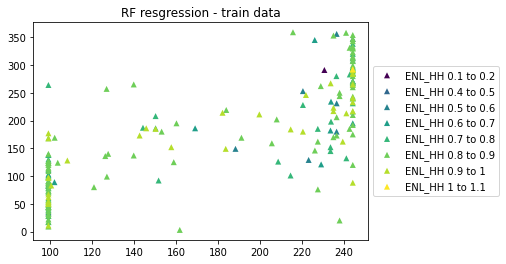

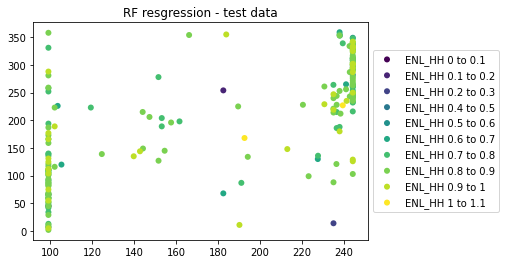



***ENL_HV*** 



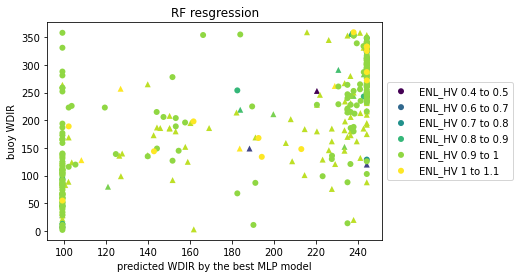

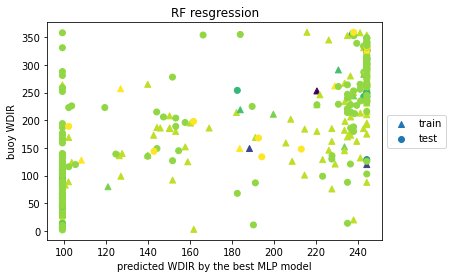

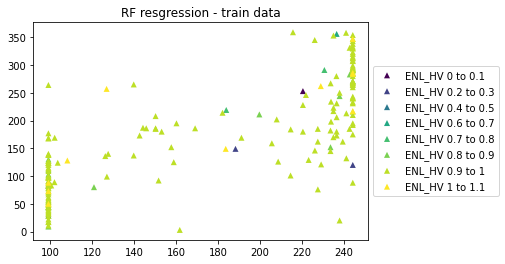

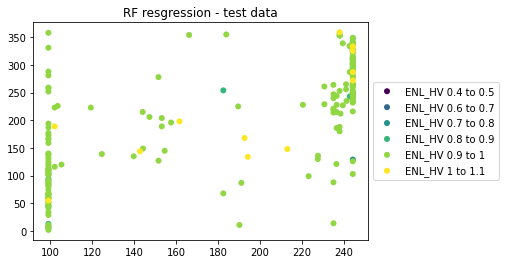



***ENL_VV*** 



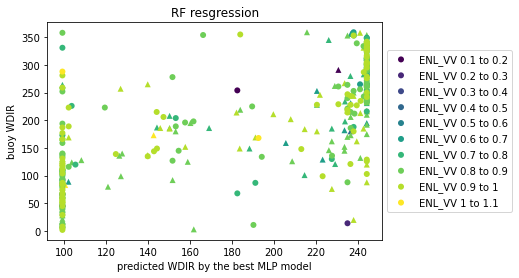

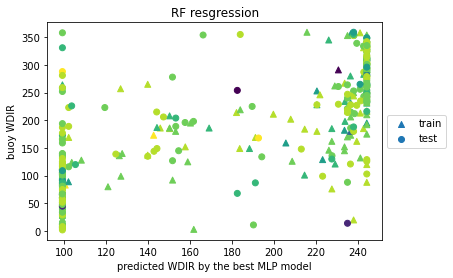

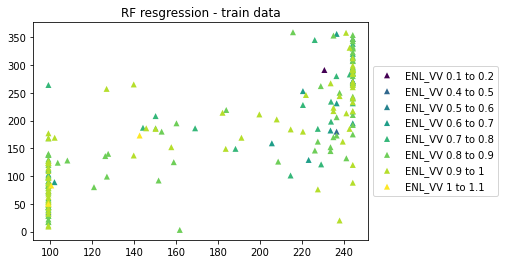

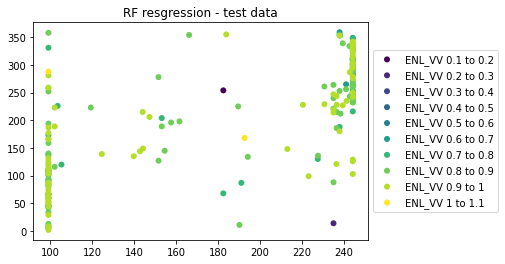



***noise*** 



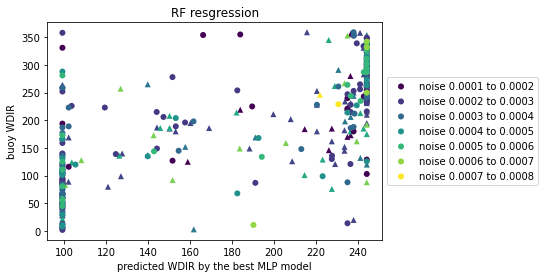

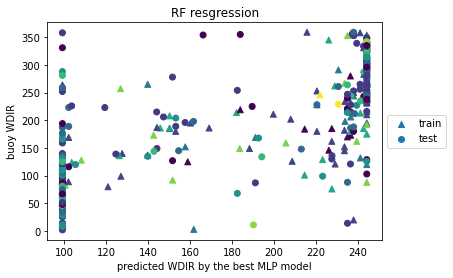

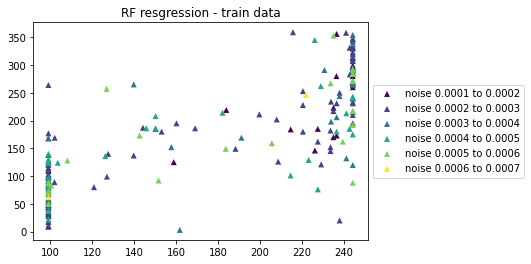

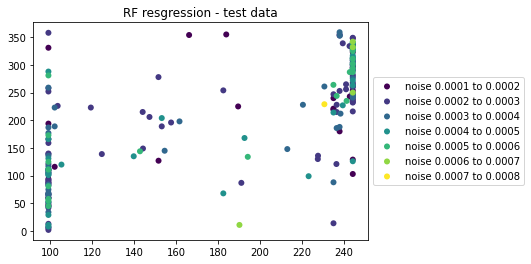



***buoy_PRES*** 



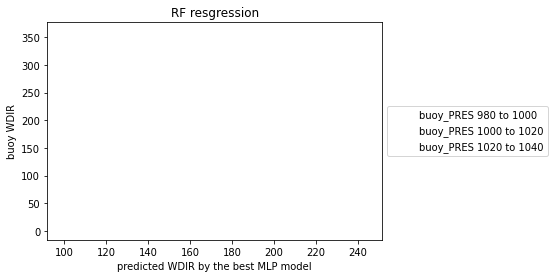

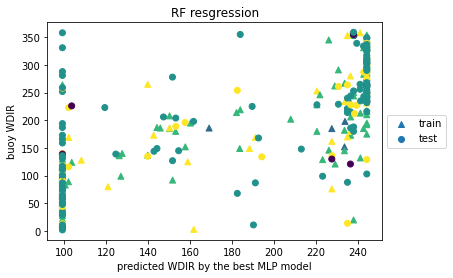

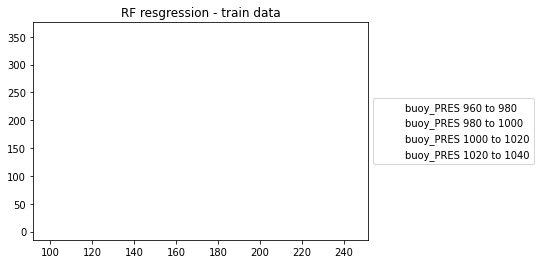

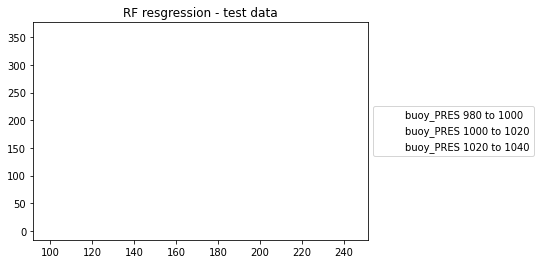



***buoy_DPD*** 



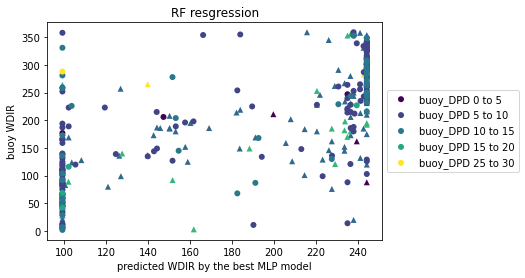

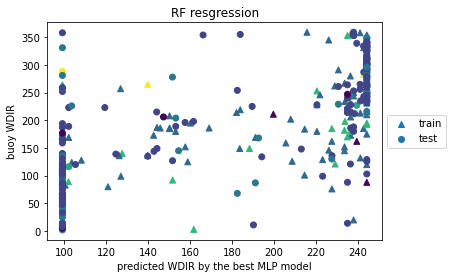

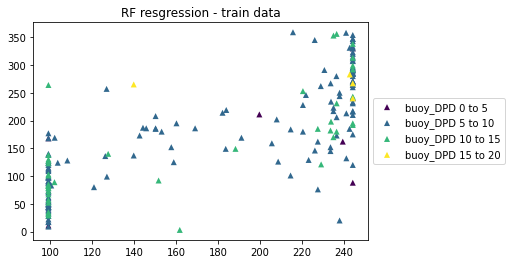

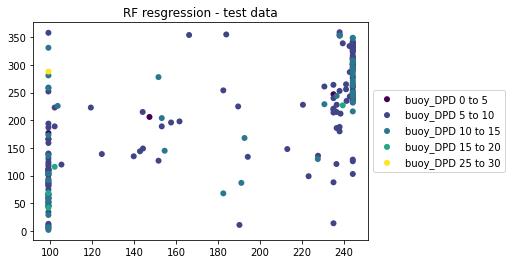



***buoy_SST*** 



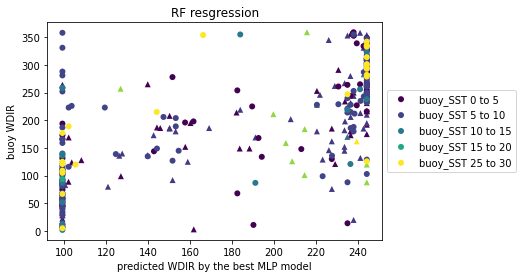

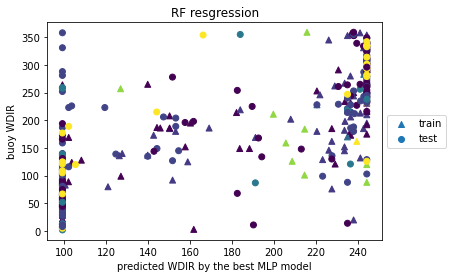

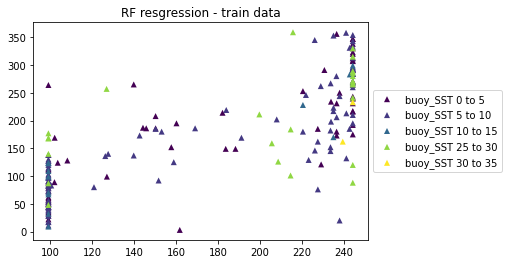

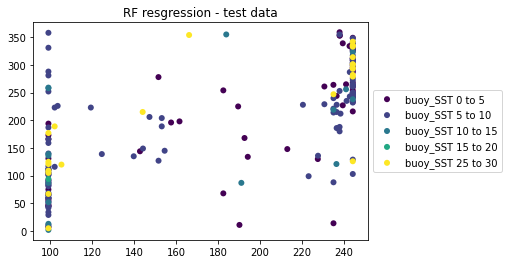



***buoy_DEWP*** 



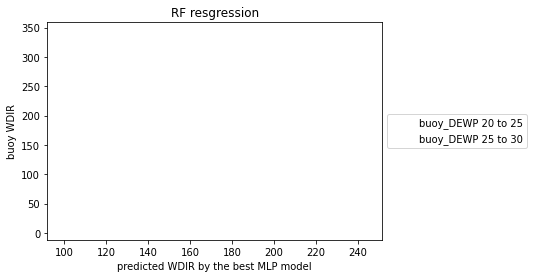

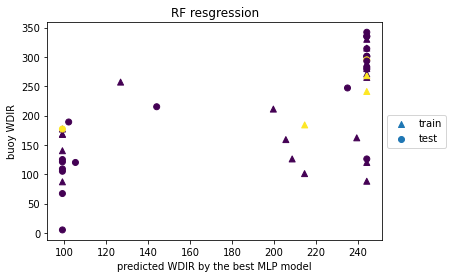

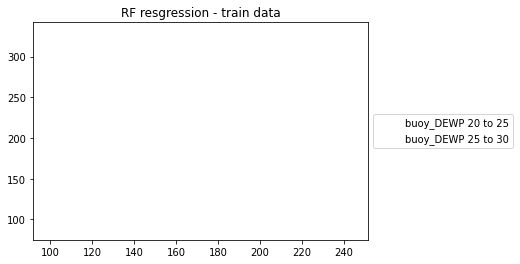

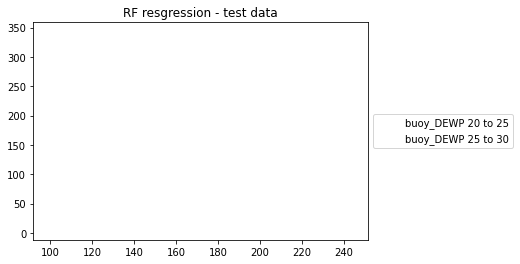



***buoy_ATMP*** 



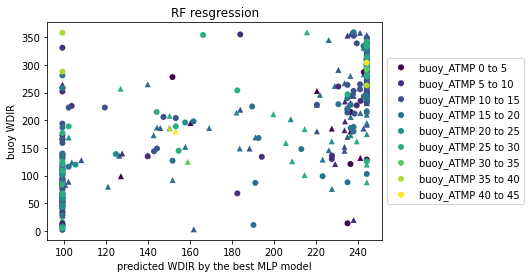

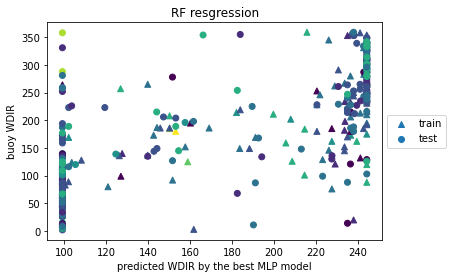

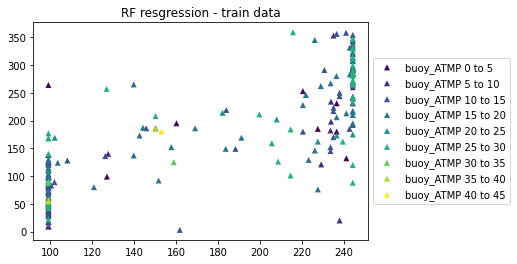

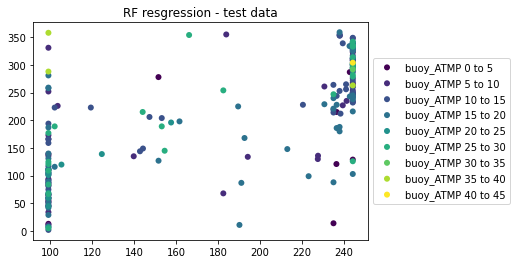



***buoy_longitude*** 



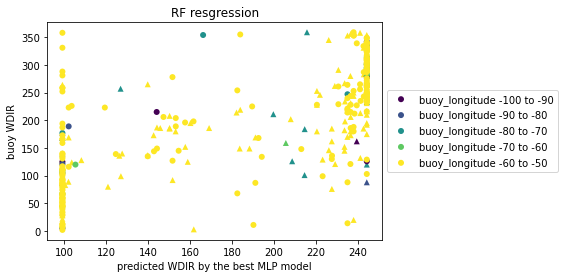

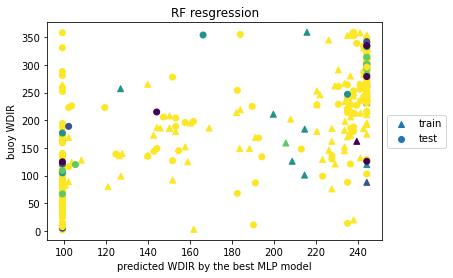

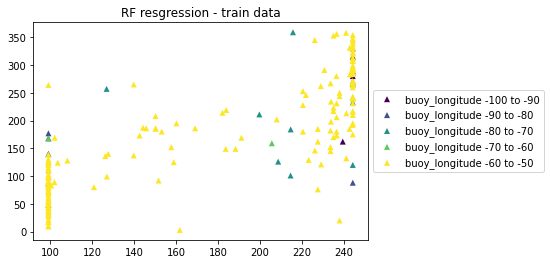

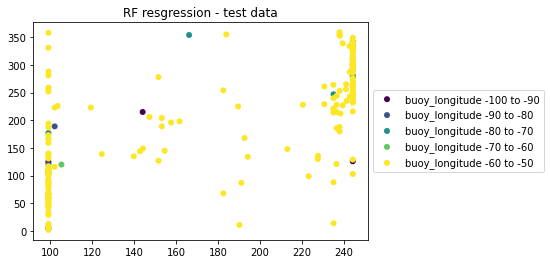



***buoy_latitude*** 



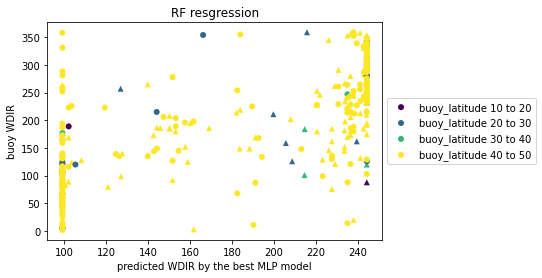

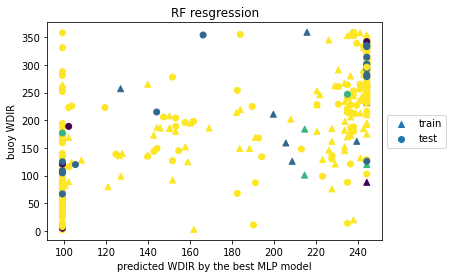

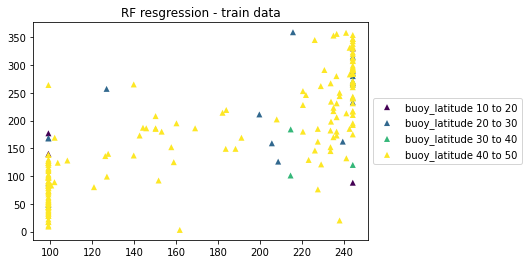

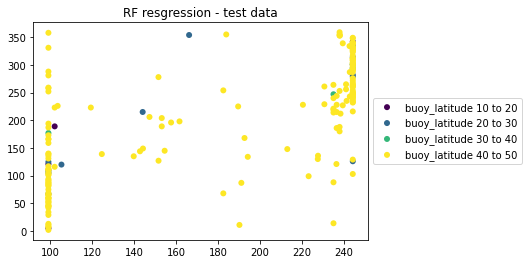



***rs2_month*** 



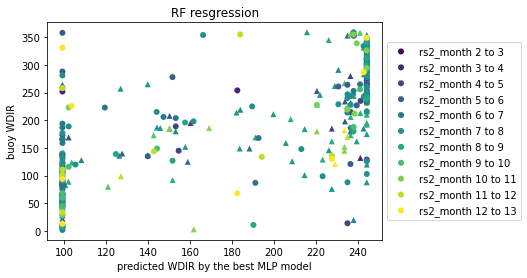

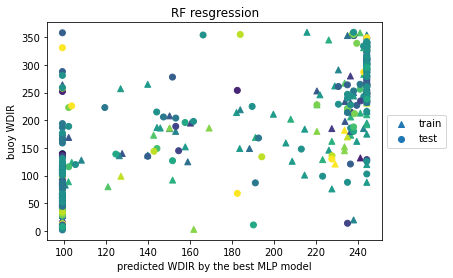

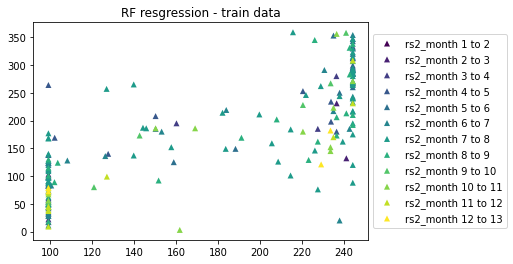

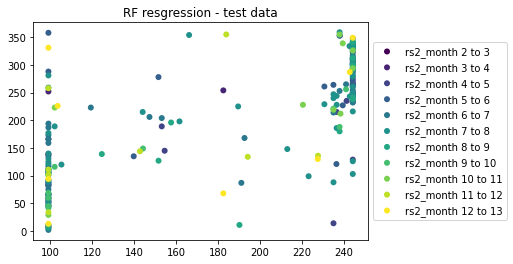



***rs2_year*** 



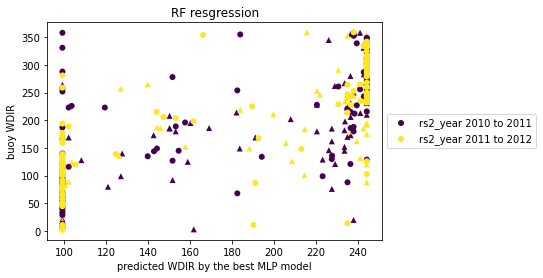

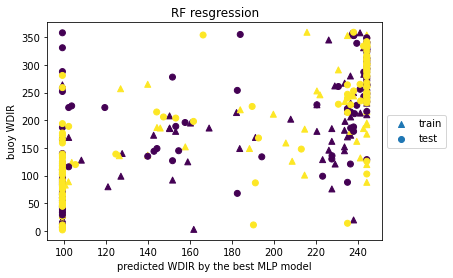

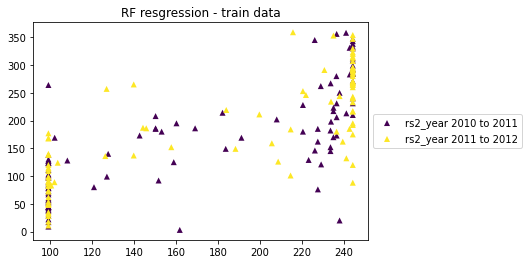

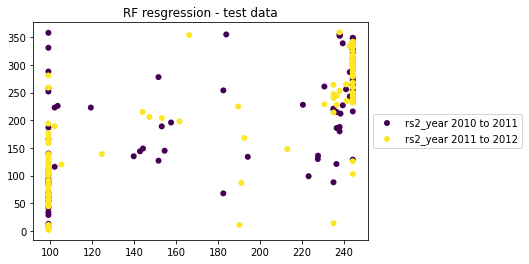



***RS2_day_of_year*** 



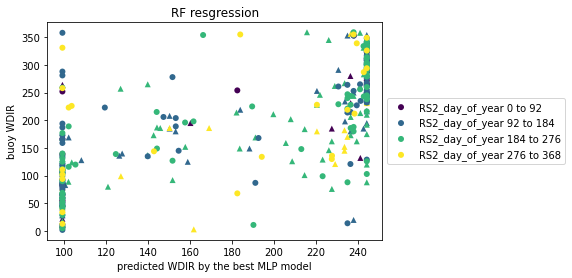

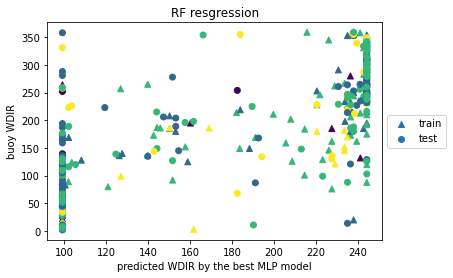

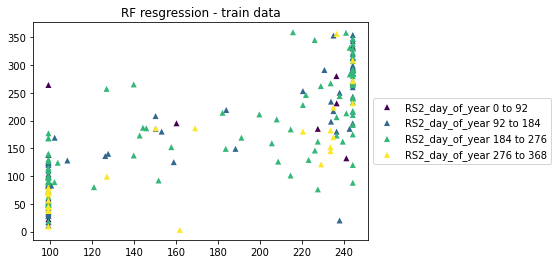

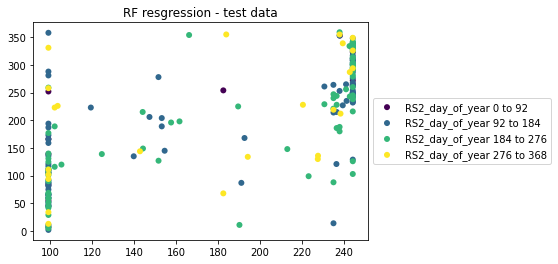




 
Best fold number: 2
Best model rmse: 74.963
Best model mae: 56.891
Best model r2: 0.449
Best model cc: 0.700
Best model parameters: {'bootstrap': True, 'max_depth': 1, 'min_samples_leaf': 8, 'min_samples_split': 8, 'n_estimators': 98} 
 


 



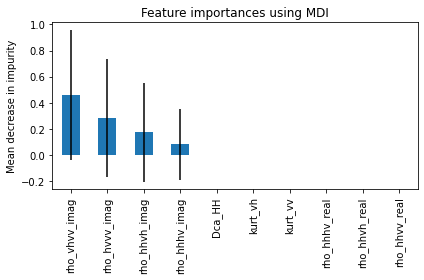

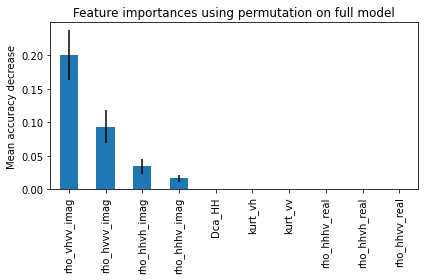


 
statistics 



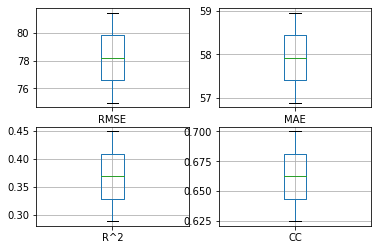


 
Final, out of sample rmse: 78.2785409267892
Final, out of sample mean absolute error: 57.92293236291506
Final, out of sample r2: 0.3837243742441492
Final, out of sample correlation coefficient: 0.6342647371414245 
 



In [ ]:
##------------------------------------------------------------------------------
## inputs' and outputs' directories
##------------------------------------------------------------------------------
# ## without smoothing filters
# outputs_address = '/content/drive/My Drive/Colab Notebooks/outputs.mat'
# inputs_address = '/content/drive/My Drive/Colab Notebooks/inputs.mat'

## with smoothdate filter and window size of 31
# inputs_address = '/content/drive/My Drive/Colab Notebooks/inputs_smoothdata_WS31.mat'
# outputs_address = '/content/drive/My Drive/Colab Notebooks/outputs_smoothdata_WS31.mat'

# ## with Box car filter and window size of 31
# inputs_address = '/content/drive/My Drive/Colab Notebooks/inputs_BoxCar_WS31.mat'
# outputs_address = '/content/drive/My Drive/Colab Notebooks/outputs_BoxCar_WS31.mat'

# ##ts_address = '/content/drive with Box car filter and window size of 11
# inputs_address = '/content/drive/My Drive/Colab Notebooks/Wind_estimation/inputs_BoxCar_WS11.mat'
# outputs_address = '/content/drive/My Drive/Colab Notebooks/Wind_estimation/outputs_BoxCar_WS11.mat'

## filtered by Box car with window size 31, input with Doppler centroid
inputs_address = '/content/drive/My Drive/Colab Notebooks/Wind_estimation/inputs_Box car_31_with_Dca.mat'
outputs_address = '/content/drive/My Drive/Colab Notebooks/Wind_estimation/outputs_Box car_31_with_Dca.mat'
data_all_address = '/content/drive/My Drive/Colab Notebooks/Wind_estimation/data_all_20211210.mat'

##------------------------------------------------------------------------------
## import inputs and outputs
##------------------------------------------------------------------------------
inputs, outputs, data_all = import_data(inputs_address, outputs_address, data_all_address)

invalids = ('name', 'hh', 'hv', 'vh', 'vv', 'rho_hvhh_real', 'rho_hvhh_imag', \
           'rho_vhhh_real', 'rho_vhhh_imag', 'rho_vvhh_real', \
           'rho_vvhh_imag', 'rho_vhhv_real', 'rho_vhhv_imag', 'rho_vvhv_real', \
           'rho_vvhv_imag', 'rho_vvvh_real', 'rho_vvvh_imag')
for key in invalids:
    if key in inputs:
        del inputs[key]
del outputs['name']

# inputs_rho = pd.DataFrame(np.array([inputs['rho_hhhv_real'], inputs['rho_hhhv_imag'], inputs['rho_hhvh_real'], \
#                             inputs['rho_hhvh_imag'], inputs['rho_hhvv_real'], inputs['rho_hhvv_imag'], \
#                             inputs['rho_hvvh_real'], inputs['rho_hvvh_imag'], inputs['rho_hvvv_real'], \
#                             inputs['rho_hvvv_imag'], inputs['rho_vhvv_real'], inputs['rho_vhvv_imag']]), \
#                    columns=['rho_hhhv_real', 'rho_hhhv_imag', 'rho_hhvh_real', \
#                             'rho_hhvh_imag', 'rho_hhvv_real', 'rho_hhvv_imag', \
#                             'rho_hvvh_real', 'rho_hvvh_imag', 'rho_hvvv_real', \
#                             'rho_hvvv_imag', 'rho_vhvv_real', 'rho_vhvv_imag'])
# inputs_rho = inputs[['rho_hhhv_real', 'rho_hhhv_imag', 'rho_hhvh_real', \
#                             'rho_hhvh_imag', 'rho_hhvv_real', 'rho_hhvv_imag', \
#                             'rho_hvvh_real', 'rho_hvvh_imag', 'rho_hvvv_real', \
#                             'rho_hvvv_imag', 'rho_vhvv_real', 'rho_vhvv_imag', 'incidence_angle']]

# inputs = inputs_rho.copy()

## return the real part of the complex values of inputs
inputs = inputs.apply(lambda x: np.real(x))

wdir_estimation = 1
theta_step = 32 # all incidence angle [19, 51]
wspd_step = 6 # [0, 6], [6, 20]
normalization = 1
## "normalization": (min_max_normalization, (0, 1)) or
## "standardization": (mean_normalization)
scaling_method = "normalization"
selection = 0 # no feature selection

if wdir_estimation == 1:
#   del outputs['wspd_10ht']

##------------------------------------------------------------------------------
## remove invalid data with negative values of wind direction
##------------------------------------------------------------------------------
  outputs['relative_wdir'] = pd.to_numeric(outputs['relative_wdir'])
  outputs = outputs.drop(labels=194, axis=0)
  inputs = inputs.drop(labels=194, axis=0)
  data_all = data_all.drop(labels=194, axis=0)

  invalid_indexes = outputs.loc[outputs['relative_wdir'] < 0]
  if invalid_indexes['relative_wdir'].any:
    inputs.drop(invalid_indexes['relative_wdir'].index, inplace=True)
    data_all.drop(invalid_indexes['relative_wdir'].index, inplace=True)
    outputs.drop(invalid_indexes['relative_wdir'].index, inplace=True)
  ## or using this piece of code to remove invalid data with negative values of wind direction
  # invalid_indexes = outputs['relative_wdir'] < 0
  # inputs.drop(outputs[invalid_indexes].index, inplace=True)
  # outputs.drop(outputs[invalid_indexes].index, inplace=True)

  # outputs['relative_wdir'] = outputs['relative_wdir']*math.pi/180 # outputs in radian
  # outputs['relative_wdir'] = outputs['relative_wdir'] % math.pi # outputs in an interval of (0, pi)
  # outputs['relative_wdir'] = outputs['relative_wdir'] % 180 # outputs in an interval of (0, 180), ignoring eastward and westward wind
  # outputs['relative_wdir'] = outputs['relative_wdir'] % 90 # outputs in an interval of (0, 90)
  # outputs['relative_wdir'] = (outputs['relative_wdir'] + 90) % 180 # outputs in an interval of (0, 180) based on upwind(-90, 90) and downwind(90, 270)

  # outputs['relative_wdir'] = outputs['relative_wdir'] - 90
  # # ## just upwind (0, 90) and (270, 180)
  # not_wanted_wdir_indexes = outputs.loc[(outputs['relative_wdir'] > 90)]
  # outputs['relative_wdir'] = outputs['relative_wdir'] + 90
  # # ## just downpwind (180, 270)
  # # not_wanted_wdir_indexes = outputs.loc[(outputs['relative_wdir'] < 90)]
  # # outputs['relative_wdir'] = outputs['relative_wdir'] - 90
  # print(f"not_wanted_wdir_indexes: {not_wanted_wdir_indexes}")
  # if not_wanted_wdir_indexes['relative_wdir'].any():
  #   inputs.drop(not_wanted_wdir_indexes['relative_wdir'].index, inplace=True)
  #   outputs.drop(not_wanted_wdir_indexes['relative_wdir'].index, inplace=True)
  # # print(f"wdir: {outputs['relative_wdir']}")

  outputs['relative_wdir'] = outputs['relative_wdir'].apply(np.ceil)


# ##------------------------------------------------------------------------------
# ## select predictor variables
# ##------------------------------------------------------------------------------
#   selected_inputs = predictor_selection(inputs, outputs, alpha=1.0, \
#                                         selection_criteria=0.01)

##------------------------------------------------------------------------------
## filter data based on ranges of incidence angle and wind speed values
##------------------------------------------------------------------------------
  theta_bin = min(inputs['incidence_angle'])
  bin_number = 1
  while theta_bin < max(inputs['incidence_angle']):

    theta_min = inputs['incidence_angle'] >= theta_bin
    theta_max = inputs['incidence_angle'] < (theta_bin + theta_step)

    # wspd_bin = min(outputs['wspd_10ht'])
    wspd_bin = 0
    while wspd_bin < max(outputs['wspd_10ht']):

      print('**********bin_number: {:.0f}**********'.format(bin_number))
      print("Incidence angle range: {:.0f} to {:.0f}".format(theta_bin, \
                          (theta_bin + theta_step)))
      print("Wind speed range: {:.0f} to {:.0f}".format(wspd_bin, \
                          (wspd_bin + wspd_step)))

      wspd_min = outputs['wspd_10ht'] >= wspd_bin
      wspd_max = outputs['wspd_10ht'] < (wspd_bin + wspd_step)

      input_theta_bin = inputs[theta_min & theta_max & wspd_min & wspd_max]
      data_all_theta_bin = data_all[theta_min & theta_max & wspd_min & wspd_max]
      output_theta_bin = outputs[theta_min & theta_max & wspd_min & wspd_max]

      ## remove NaNs
      input_theta_bin.dropna()
      data_all_theta_bin.dropna()
      if len(input_theta_bin) == 0:
          print('No data is detected for these ranges of incidence angle and wind speed!')
          # theta_bin = theta_bin + theta_step
          wspd_bin = wspd_bin + wspd_step
          bin_number = bin_number + 1
          continue

      wspd = output_theta_bin['wspd_10ht']
      theta_i = input_theta_bin['incidence_angle']
      if wdir_estimation == 1:
        del output_theta_bin['wspd_10ht']
        del input_theta_bin['incidence_angle']

        ## sample size after the theta_i and wind speed filters
        n_of_samples = np.shape(input_theta_bin)[0]
        print("sample size: {:.0f}".format(n_of_samples))


      ##------------------------------------------------------------------------------
      ## scale predictor variables
      ##------------------------------------------------------------------------------
      if normalization == 1:
        inputs_scaled = predictor_scaling(input_theta_bin, scaling_method)
      else:
        inputs_scaled = input_theta_bin.copy()

      ##------------------------------------------------------------------------------
      ## select predictor variables
      ##------------------------------------------------------------------------------
      if selection == 1:
        # ## correlation coefficient between the relative wind direction and
        # ## Radarsat-2 polarimetric features
        corre_coefs = []
        corrs = []
        for field in inputs_scaled.keys():
          corre_coef = np.corrcoef(np.transpose(inputs_scaled[field]).astype(float), \
                  np.transpose(output_theta_bin.values).astype(float))
          corre_coefs.append([corre_coef[0, 1]])
          corrs.append([field, corre_coef[0, 1]])
        print('correlation coefficient between the relative wind directions and '
              'Radarsat-2 polarimetric features: ')
        print(corrs)
        # print(corre_coefs)
        # print(inputs.keys())
        # cc = pd.DataFrame(np.transpose(corre_coefs), columns=inputs_scaled.keys(), index=None)
        # print('correlation coefficient between the relative wind directions and '
        #       'Radarsat-2 polarimetric features: ')
        # print(cc)
        # selection_criteria = 0.1
        # selected_columns = cc.abs() > selection_criteria
        # if np.any(selected_columns.values):
        #   selected_inputs = inputs_scaled.loc[:, selected_columns.values.transpose()]
        # else:
        #   selected_columns = abs(cc.values) == max(abs(cc.values))
        #   selected_inputs = inputs_scaled.loc[:, selected_columns.values.transpose()]
        # print('\nselected input features')
        # print(selected_inputs.keys())
        # print('\n selected input correlation coefficients with relative wind direction:')
        # print(cc.loc[:, selected_columns.values.transpose()])
        # inputs_scaled = selected_inputs.copy()
        ## model_name = 'Lasso' or 'Ridge' or 'correlation'
        ## alpha=0.5, selection_criteria=0.1, model_name='Lasso'
        inputs_selected = predictor_selection(inputs_scaled, output_theta_bin, \
                          alpha=0.1, selection_criteria=0.1, model_name='Lasso')
      else:
        inputs_selected = inputs_scaled.copy()


      ##------------------------------------------------------------------------------
      ## add day of year to data_all
      import datetime

      dayOfYear = []
      years = np.array(data_all['rs2_year'])
      months = np.array(data_all['rs2_month'])
      days = np.array(data_all['rs2_day'])
      for i in range(np.size(years)):
        x = datetime.datetime(years[i], months[i], days[i])
        dayOfYear.append(x.strftime("%j"))

      data_all['RS2_day_of_year'] = dayOfYear

      ##------------------------------------------------------------------------------
      ## predict wind direction with regression models
      ##------------------------------------------------------------------------------
      ##------------------------------------------------------------------------------
      ## neural network multi-layer Perceptron (NN-MLP) regressor

      """
      based on sklearn documentation on https://scikit-learn.org/stable/modules/generated/sklearn.neural_network.MLPRegressor.html

      activation: {‘identity’, ‘logistic’, ‘tanh’, ‘relu’}, default=’relu’
      Activation function for the hidden layer.
      ‘identity’, no-op activation, useful to implement linear bottleneck, returns f(x) = x
      ‘logistic’, the logistic sigmoid function, returns f(x) = 1 / (1 + exp(-x)).
      ‘tanh’, the hyperbolic tan function, returns f(x) = tanh(x).
      ‘relu’, the rectified linear unit function, returns f(x) = max(0, x)

      solver: {‘lbfgs’, ‘sgd’, ‘adam’}, default=’adam’
      The solver for weight optimization.
      ‘lbfgs’ is an optimizer in the family of quasi-Newton methods.
      ‘sgd’ refers to stochastic gradient descent.
      ‘adam’ refers to a stochastic gradient-based optimizer proposed by Kingma, Diederik, and Jimmy Ba
      Note: The default solver ‘adam’ works pretty well on relatively
      large datasets (with thousands of training samples or more) in terms of
      both training time and validation score. For small datasets, however,
      ‘lbfgs’ can converge faster and perform better.

      alpha: float, default=0.0001
      L2 penalty (regularization term) parameter.

      batch_size: int, default=’auto’
      Size of minibatches for stochastic optimizers. If the solver is ‘lbfgs’,
      the classifier will not use minibatch.
      When set to “auto”, batch_size=min(200, n_samples)
      """

      """
      based on tensorflow.keras.optimizers documentation on https://www.tensorflow.org/api_docs/python/tf/keras/optimizers


      optimizer=solver: {'Adadelta', 'Adagrad', 'Adam', 'Adamax', 'Ftrl', \
      'Nadam', 'Optimizer', 'RMSprop', 'SGD'}

      """
      # output_predict_mlp, accuracy_mlp, std_mlp = \
      #   mlp_regression(inputs_selected, output_theta_bin, activation='identity', \
      #                 solver='lbfgs', alpha=0.0001, batch_size=200, max_iter=1000, k_fold=10)
      ## built-in optimizer classes
      # print(f"inputs_selected {type(output_theta_bin)}")
      # output_predict_mlp = \
      # mlp_regression(inputs_selected, output_theta_bin, activation='relu', \
      #               solver='adam', max_iter=500, k_fold=5)
      output_predict_mlp = \
          mlp_regression(inputs_selected, output_theta_bin, data_all, \
                         k_fold=2, n_repeats=1)

      ##----------------------------------------------------------------------------
      ## Random forests regression
      output_predict_rf = \
          random_forest_regression(inputs_selected, output_theta_bin, \
                                   data_all, k_fold=2, n_repeats=1)

      ##----------------------------------------------------------------------------
      ## write the results on a spread sheet
      # # gc = gspread.service_account()

      # # ## create a spreadsheet
      # # sh = gc.create('WDIR_results')

      # # # Open a sheet in the spreadsheet and add some data.
      # # worksheet = gc.open('WDIR_results').sheet1

      # # worksheet.update('A1', 'wspd_bin')
      # # worksheet.update('A2', wspd_bin)


      ## export the predicted results on Drive
      from scipy.io import savemat
      # drive.mount('/content/drive')
      savemat("/content/drive/My Drive/Colab Notebooks/Wind_estimation/WDIR_predicted_mlp.mat", {"WDIR_predicted_mlp":output_predict_mlp})
      savemat("/content/drive/My Drive/Colab Notebooks/Wind_estimation/WDIR_predicted_rf.mat", {"WDIR_predicted_rf":output_predict_rf})

      wspd_bin = wspd_bin + wspd_step
      wspd_step = 14
      bin_number = bin_number + 1

    theta_bin = theta_bin + theta_step






In [ ]:
data_a = data_all.copy()
print('data_all_keys:')
print(data_a.keys())
key = 'rs2_year'
print(data_a[key].min())
print(data_a[key].max())
data_a.replace({key: -99}, np.NaN, inplace=True)
print(data_a[key].min())
print(data_a[key])
plt.scatter(data_a[key], data_a[key], label='one')
plt.scatter(data_a[key], data_a[key], label='two')
plt.legend(loc='center left', bbox_to_anchor=(1, 0.5))
plt.show()

import datetime

dayOfYear = []
# years, months, days = data_a['rs2_year'], data_a['rs2_month'], data_a['rs2_day']
years = np.array(data_a['rs2_year'])
months = np.array(data_a['rs2_month'])
days = np.array(data_a['rs2_day'])

for i in range(np.size(years)):
  x = datetime.datetime(years[i], months[i], days[i])
  dayOfYear.append(x.strftime("%j"))

data_a['day_of_year'] = dayOfYear


NameError: ignored

In [ ]:
## polarized residual Doppler frequency (based on Faozi Saeid's thesis 2015)
PRDF_HH_VV = np.array(inputs['Dca_HH']) - np.array(inputs['Dca_VV'])
PRDF_HV_VV = np.array(inputs['Dca_HV']) - np.array(inputs['Dca_VV'])
PRDF_HV_HH = np.array(inputs['Dca_HV']) - np.array(inputs['Dca_HH'])

# for key in inputs.keys():
#   print(key)

for key in data_all.keys():
  print(key)

print(data_all['hh'], data_all['Ihh'], data_all['J_hh'])
# print(inputs['s0'])
# ## parameters based on coherence matrix
eigen_value_1 = inputs['eigen_val_1']
# eigen_value_2 = inputs['eigen_val_2']
# eigen_value_3 = inputs['eigen_val_3']
# sum_eigen_values = eigen_value_1 + eigen_value_2 + eigen_value_3
# P_1 = eigen_value_1/sum_eigen_values
# P_2 = eigen_value_2/sum_eigen_values
# P_3 = eigen_value_3/sum_eigen_values
# ## Cloude and Pottier decomposition [31, 32, 35 Paper A, AAFC]
# alpha_CloudePottier = math.pi/2*(P_2 + P_3) ## an indicator of the average or dominant scattering
# anisotropy_CloudePottier = (P_2 - P_3)/(P_2 + P_3) ## an indicator of the intensity disparity between the second and the third scattering mechanisms
# entropy_CloudePottier = -(P_1*math.log10(P_1)/math.log10(3) + P_2*math.log10(P_2)/math.log10(3) + P_3*math.log10(P_3)/math.log10(3)) ## an indicator of the degree of randomness of the scattering mechanisms
# ## pedestal height
# pedestal_height = min([eigen_value_1, eigen_value_2, eigen_value_3])/max([eigen_value_1, eigen_value_2, eigen_value_3]) ## an indicator of the portion of the unpolarized scattering component, a measure of randomness in the scattering process

columns = ['PRDF_HH_VV', 'PRDF_HV_VV', 'PRDF_HV_HH']
data = np.transpose([PRDF_HH_VV, PRDF_HV_VV, PRDF_HV_HH])
test = pd.DataFrame(data, columns=columns)

print(test)


incidence_angle
Dca_HH
Dca_HV
Dca_VH
Dca_VV
name
Ihh
Ihv
Ivh
Ivv
s0
s1
s2
s3
hh
hv
vh
vv
dop
dlp
dcp
lpr
cpr
psi
gamma
cvar_hh
cvar_hv
cvar_vh
cvar_vv
skew_hh
skew_hv
skew_vh
skew_vv
kurt_hh
kurt_hv
kurt_vh
kurt_vv
rho_hhhv_real
rho_hhhv_imag
rho_hhvh_real
rho_hhvh_imag
rho_hhvv_real
rho_hhvv_imag
rho_hvhh_real
rho_hvhh_imag
rho_hvvh_real
rho_hvvh_imag
rho_hvvv_real
rho_hvvv_imag
rho_vhhh_real
rho_vhhh_imag
rho_vhhv_real
rho_vhhv_imag
rho_vhvv_real
rho_vhvv_imag
rho_vvhh_real
rho_vvhh_imag
rho_vvhv_real
rho_vvhv_imag
rho_vvvh_real
rho_vvvh_imag
J_hh
J_hv
J_vh
J_vv
eig_val_1
eig_val_2
dp
entropy
alpha_pauli
beta_pauli
gamma_pauli
subdir
rs2_year
rs2_month
rs2_day
rs2_hour
rs2_minute
rs2_second
noise
ENL_HH
ENL_HV
ENL_VH
ENL_VV
buoy_id
buoy_agency
buoy_year
buoy_month
buoy_day
buoy_hour
buoy_minute
buoy_second
buoy_latitude
buoy_longitude
buoy_Hs
buoy_DPD
buoy_APD
buoy_PRES
buoy_ATMP
buoy_DEWP
buoy_SST
relative_wdir
wspd_10ht
RS2_day_of_year
0     -17.749143
1     -19.877814
2     -19.31

KeyError: ignored

theta_step = 2
wspd_step = 5
normalization = 1
scaling_method = "normalization"
selection = 0

repeated k-fold: k_fold = 5, n_repeats = 3

normalization = 1, min_max

selection = 0

Random forest is done by trying to find the optimum values for its hyperparameters.

